# CNN-RNN Model Training, Dependent Labels
## Author: Ian Scarff (iie728)

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
import torch.nn.functional as F
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
import skimage

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

## Setup

In [2]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [3]:
from CustomLoader import ImageLoader

In [4]:
training_data = ImageLoader(json_file = 'training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = ImageLoader(json_file = 'testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [5]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 

## Define CNN-RNN Architectures (Set Hidden Size)

### ResNet18-LSTM

In [6]:
### Define Class
class ResNet18_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        ### Freeze Parameters
        for param in resnet18.parameters():
            param.requires_grad = False
            
        ### CNN Encoder, remove prediction layer
        self.cnn = nn.Sequential(*list(resnet18.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM

In [7]:
### Define Class
class ResNet50_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        for param in resnet50.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet50.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)    
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM

In [8]:
### Define Class
class ResNet101_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        for param in resnet101.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet101.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet121-LSTM

In [9]:
### Define Class
class DenseNet121_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 50176 # densenet121.classifier.in_features
        
        for param in densenet121.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet121.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
#         self.cnn_output_size = image_emb.shape[0]
        
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)

        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM

In [10]:
### Define Class
class DenseNet169_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 81536 # densenet169.classifier.in_features
        
        for param in densenet169.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet169.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
           
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM

In [11]:
### Define Class
class DenseNet201_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 94080 #densenet201.classifier.in_features
        
        
        for param in densenet201.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet201.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        
        image_emb = torch.flatten(image_emb, 1)
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM

In [12]:
### Define Class
class VGG11_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
       
        for param in vgg11bn.parameters():
            param.requires_grad = False

        
        vgg11bn.classifier = nn.Sequential(*list(vgg11bn.classifier.children())[:-1])
        
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM

In [13]:
### Define Class
class VGG16_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        for param in vgg16bn.parameters():
            param.requires_grad = False

        
        vgg16bn.classifier = nn.Sequential(*list(vgg16bn.classifier.children())[:-1])

            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM

In [14]:
### Define Class
class VGG19_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        for param in vgg19bn.parameters():
            param.requires_grad = False

        
        vgg19bn.classifier = nn.Sequential(*list(vgg19bn.classifier.children())[:-1])
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [15]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [16]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN(model = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((model == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network = model
            if torch.cuda.is_available():
                network.cuda()
                network = nn.DataParallel(network, list(range(2)))
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer = optim.Adam(network.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, targets = data[0].to(device), data[1].float().to(device)
                    optimizer.zero_grad()
                    
                    output = network(images)
                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer.step()
                                        
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network.eval()
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, targets = data[0].to(device), data[1].float().to(device)
                    output = network(images)
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network.state_dict(), 'BestCnnRnnModels/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
            
            fig.savefig('CNN_RNN_500_1_0_TrainingSummary/' + model_name + '_FOLD' + str(fold+1) + '.png')
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 

## Initialize Models: Hidden Size = 500, Number of Layers = 1, Dropout = 0

In [17]:
resnet18LSTM_500_1_0 = ResNet18_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
resnet50LSTM_500_1_0 = ResNet50_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
resnet101LSTM_500_1_0 = ResNet101_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)

densenet121LSTM_500_1_0 = DenseNet121_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
densenet169LSTM_500_1_0 = DenseNet169_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
densenet201LSTM_500_1_0 = DenseNet201_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)

vgg11bnLSTM_500_1_0 = VGG11_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
vgg16bnLSTM_500_1_0 = VGG16_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
vgg19bnLSTM_500_1_0 = VGG19_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)

# 
# 

## Train Models

In [18]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0164 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0509 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0342 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1392 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1169 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0311 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0266 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0126 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

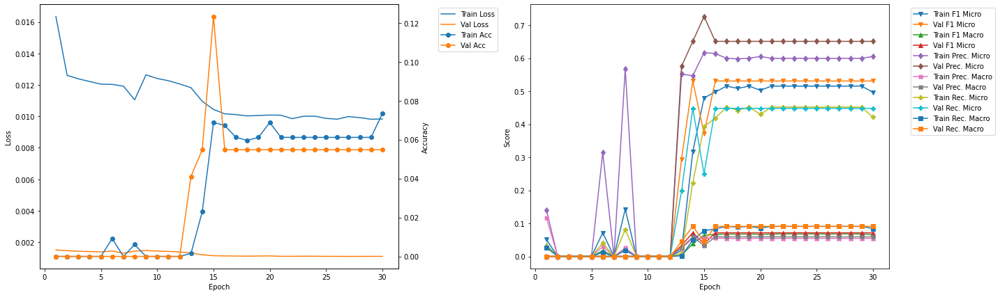

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 3.93
Train Loss: 0.0119 	Validation Loss: 0.0012
Train Accuracy: 0.0107 	Validation Accuracy: 0.0
Train F1 Mirco: 0.112 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0282 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.452 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0909 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0639 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0176 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.06
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.0443 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.408 	Validation F1 Micro: 0.5108
Train F1 Marco: 0.0605 	Validation F1 Macro: 0.0643
Train Precision Mirco: 0.5906 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0691 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.3117 	Validation Recall Micr

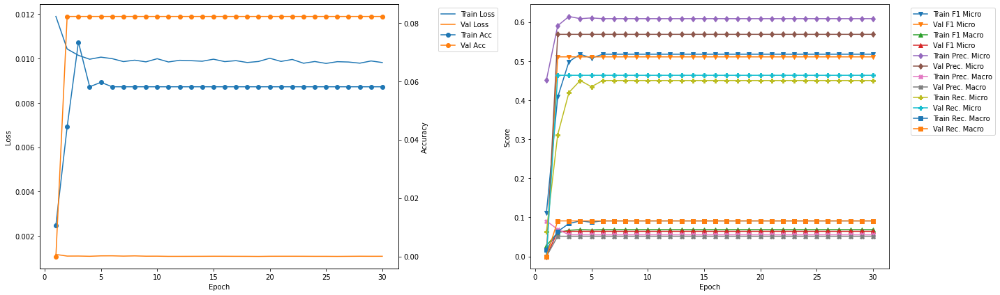

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 7.67
Train Loss: 0.0103 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4901 	Validation F1 Micro: 0.4913
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.411 	Validation Recall Micro: 0.425
Train Recall Marco: 0.082 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.79
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5198 	Validation F1 Micro: 0.4913
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4545 	Valid

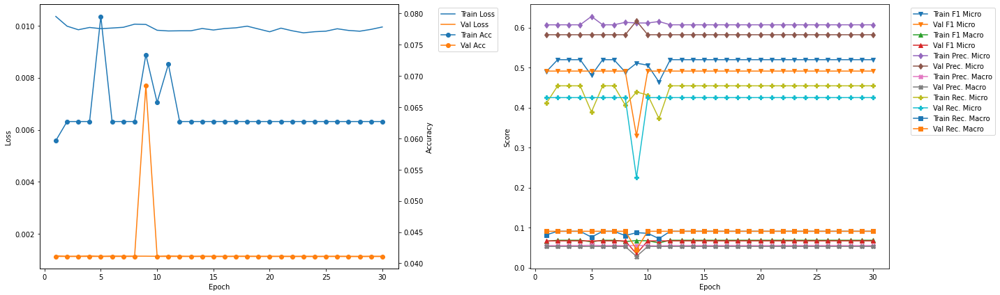

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.530726 --> 0.544928).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 11.4
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4906 	Validation F1 Micro: 0.5449
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.071
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.4113 	Validation Recall Micro: 0.4724
Train Recall Marco: 0.0824 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.53
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4865 	Validation F1 Micro: 0.5449
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.071
Train Precision Mirco: 0.6027 	Validation Precision Micro: 0.6438
Train Precision M

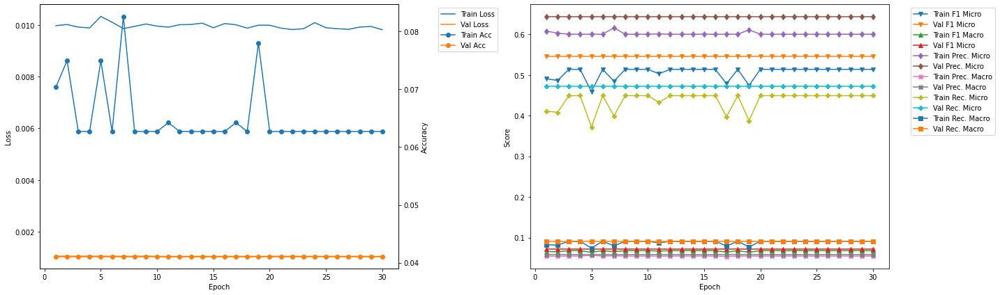

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.14
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0703 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5063 	Validation F1 Micro: 0.5296
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.0669
Train Precision Mirco: 0.6097 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4328 	Validation Recall Micro: 0.4857
Train Recall Marco: 0.0874 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.26
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4972 	Validation F1 Micro: 0.5296
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0669
Train Precision Mirco: 0.6058 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4216 	

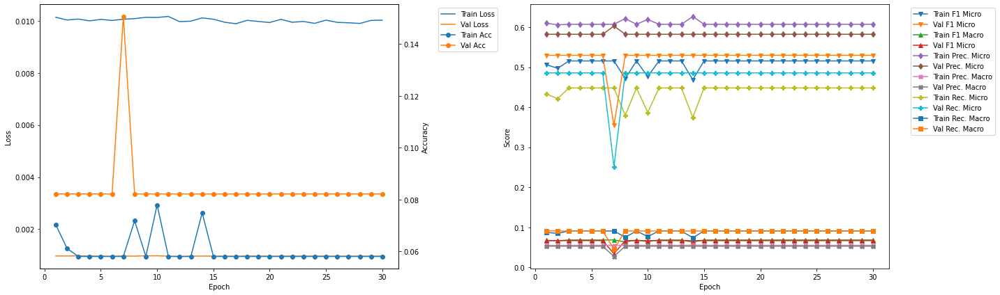

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.87
Train Loss: 0.0097 	Validation Loss: 0.0013
Train Accuracy: 0.0642 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4963 	Validation F1 Micro: 0.5014
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.606 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.4202 	Validation Recall Micro: 0.4293
Train Recall Marco: 0.0833 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.0
Train Loss: 0.0097 	Validation Loss: 0.0013
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5187 	Validation F1 Micro: 0.5014
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6047 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.4541 

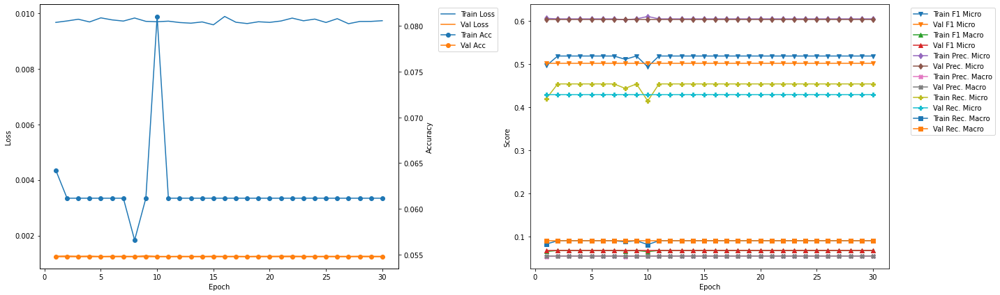

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.61
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5067 	Validation F1 Micro: 0.4629
Train F1 Marco: 0.067 	Validation F1 Macro: 0.0648
Train Precision Mirco: 0.6115 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4326 	Validation Recall Micro: 0.3971
Train Recall Marco: 0.0853 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.73
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5231 	Validation F1 Micro: 0.4629
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0648
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.457

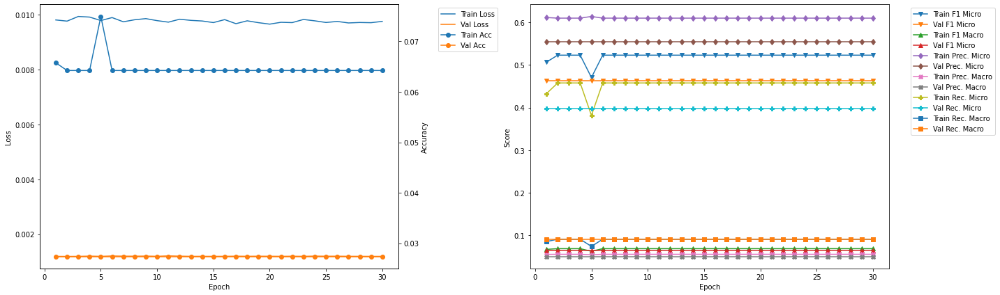

-------------------------------------------
FOLD 8
-------------------------------------------
Validation F1 Micro Score Increased (0.544928 --> 0.586510).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 26.35
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0733 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.4707 	Validation F1 Micro: 0.5865
Train F1 Marco: 0.0633 	Validation F1 Macro: 0.0743
Train Precision Mirco: 0.5982 	Validation Precision Micro: 0.6944
Train Precision Marco: 0.0534 	Validation Precision Macro: 0.0631
Train Recall Mirco: 0.388 	Validation Recall Micro: 0.5076
Train Recall Marco: 0.0779 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.47
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0519 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.5092 	Validation F1 Micro: 0.5865
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.0743
Train Precision Mirco: 0.5947 	Validation Precision Micro: 0.6944
Train Precisi

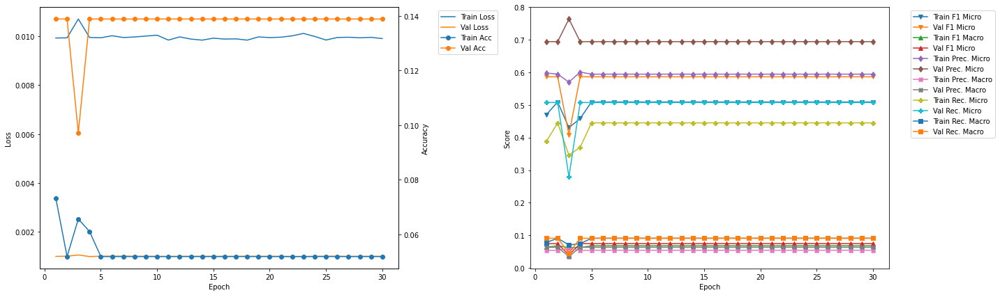

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.08
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5209 	Validation F1 Micro: 0.4807
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.6092 	Validation Precision Micro: 0.5625
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.455 	Validation Recall Micro: 0.4197
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.21
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5209 	Validation F1 Micro: 0.4807
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.6092 	Validation Precision Micro: 0.5625
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.455

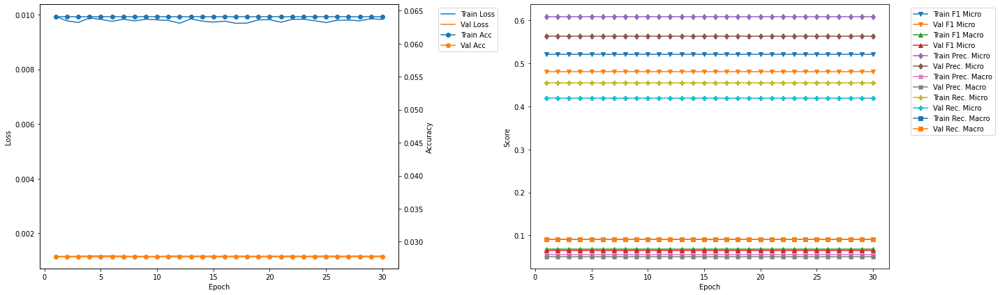

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.82
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5153 	Validation F1 Micro: 0.5321
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.449 	Validation Recall Micro: 0.4754
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.94
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5153 	Validation F1 Micro: 0.5321
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.449 

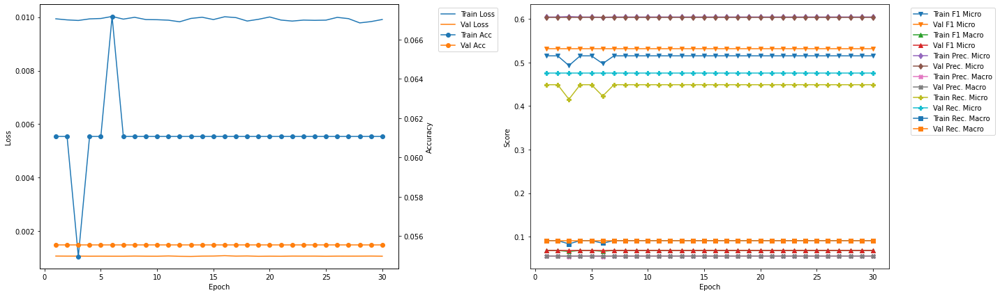

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 1
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0733 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.4707 	Validation F1 Micro: 0.5865
Train F1 Marco: 0.0633 	Validation F1 Macro: 0.0743
Train Precision Mirco: 0.5982 	Validation Precision Micro: 0.6944
Train Precision Marco: 0.0534 	Validation Precision Macro: 0.0631
Train Recall Mirco: 0.388 	Validation Recall Micro: 0.5076
Train Recall Marco: 0.0779 	Validation Recall Macro: 0.0909


In [19]:
resnet18LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = resnet18LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.14
Train Loss: 0.0169 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0459 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0355 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1314 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1071 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0278 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0355 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.28
Train Loss: 0.0124 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

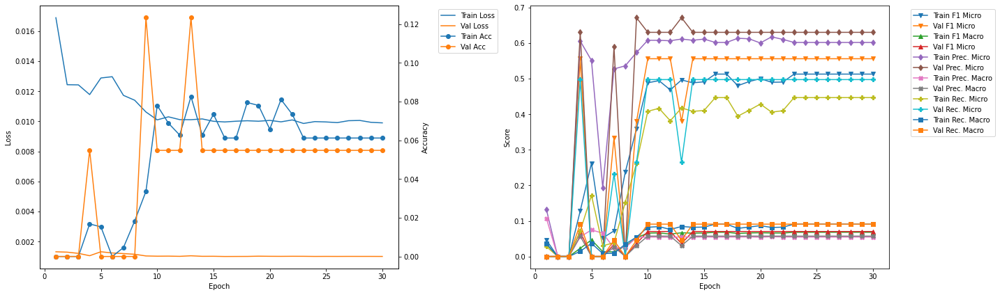

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.34
Train Loss: 0.0141 	Validation Loss: 0.0015
Train Accuracy: 0.0046 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0631 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0161 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.3486 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0845 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0347 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0095 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.48
Train Loss: 0.0131 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0

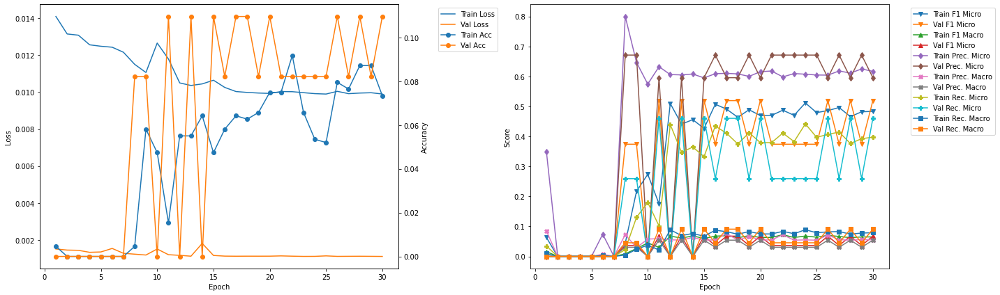

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.53
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.47 	Validation F1 Micro: 0.4985
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.5984 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.07 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.387 	Validation Recall Micro: 0.4359
Train Recall Marco: 0.0775 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.67
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5147 	Validation F1 Micro: 0.4985
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6087 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4458 	Valid

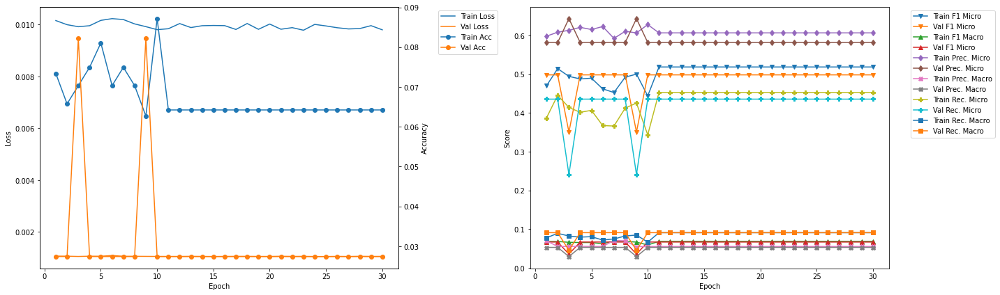

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.73
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0765 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4799 	Validation F1 Micro: 0.5125
Train F1 Marco: 0.064 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6085 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.3962 	Validation Recall Micro: 0.4319
Train Recall Marco: 0.078 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.87
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4715 	Validation F1 Micro: 0.5125
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.5979 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0585 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.3893 	Val

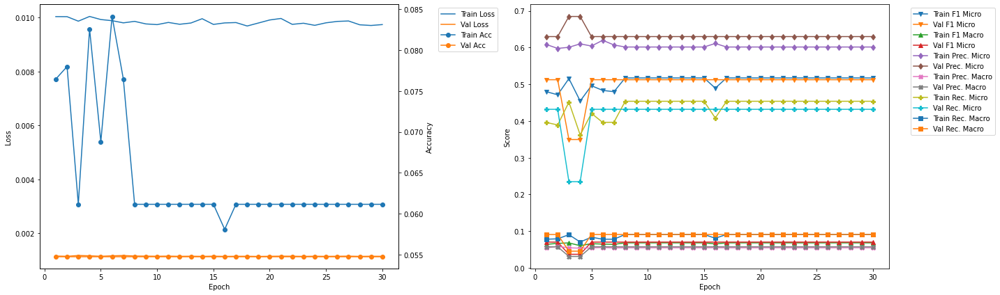

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 16.92
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4747 	Validation F1 Micro: 0.4756
Train F1 Marco: 0.0634 	Validation F1 Macro: 0.0658
Train Precision Mirco: 0.6285 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0559 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.3813 	Validation Recall Micro: 0.4089
Train Recall Marco: 0.0741 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.06
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0765 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.5007 	Validation F1 Micro: 0.4756
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0658
Train Precision Mirco: 0.6118 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.4237 

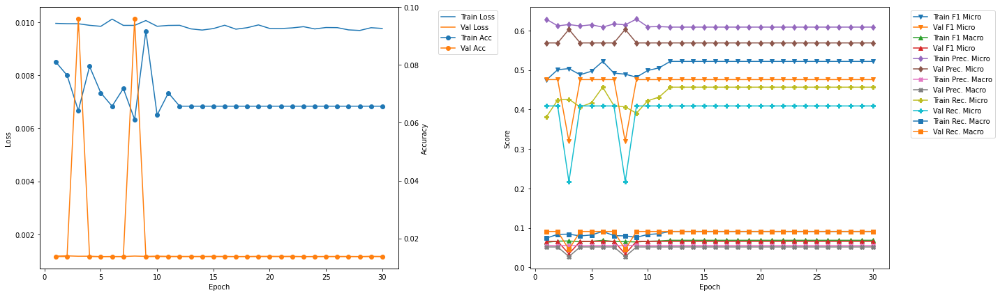

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.11
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0795 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4573 	Validation F1 Micro: 0.5294
Train F1 Marco: 0.0615 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6167 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3634 	Validation Recall Micro: 0.4639
Train Recall Marco: 0.0716 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.25
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.137
Train F1 Mirco: 0.4997 	Validation F1 Micro: 0.397
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0382
Train Precision Mirco: 0.605 	Validation Precision Micro: 0.726
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.033
Train Recall Mirco: 0.4256 	Va

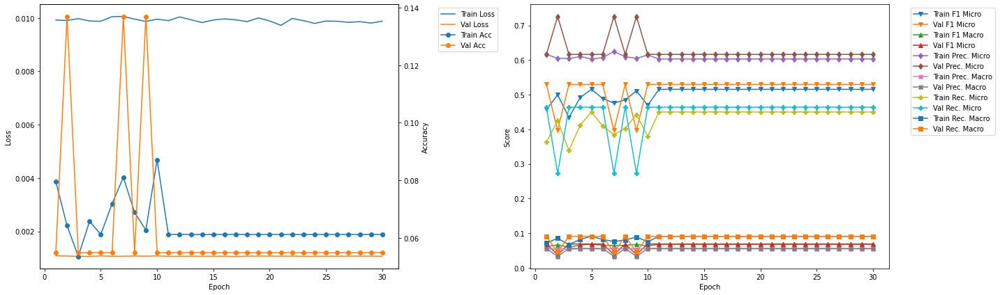

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.3
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.078 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4866 	Validation F1 Micro: 0.5044
Train F1 Marco: 0.065 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6114 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4041 	Validation Recall Micro: 0.441
Train Recall Marco: 0.08 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.44
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0933 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.486 	Validation F1 Micro: 0.5044
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6187 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4001 	Validat

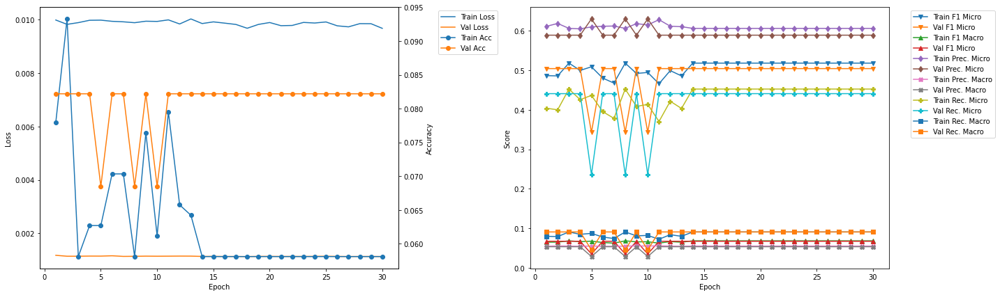

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.49
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4944 	Validation F1 Micro: 0.5119
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0679
Train Precision Mirco: 0.6058 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4177 	Validation Recall Micro: 0.4479
Train Recall Marco: 0.0832 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.63
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0595 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.512 	Validation F1 Micro: 0.3485
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0354
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.055 	Validation Precision Macro: 0.029
Train Recall Mirco: 0.4427 	Va

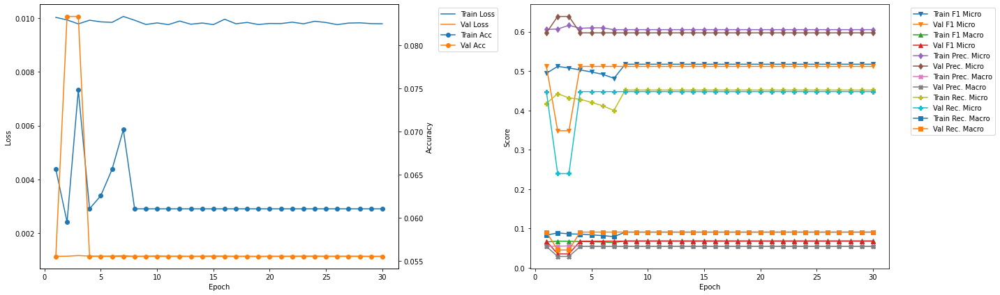

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.68
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0641 	Validation Accuracy: 0.2083
Train F1 Mirco: 0.4944 	Validation F1 Micro: 0.4091
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.039
Train Precision Mirco: 0.6058 	Validation Precision Micro: 0.75
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0341
Train Recall Mirco: 0.4177 	Validation Recall Micro: 0.2812
Train Recall Marco: 0.0837 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.82
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0855 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4803 	Validation F1 Micro: 0.5298
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.6198 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.392 	Va

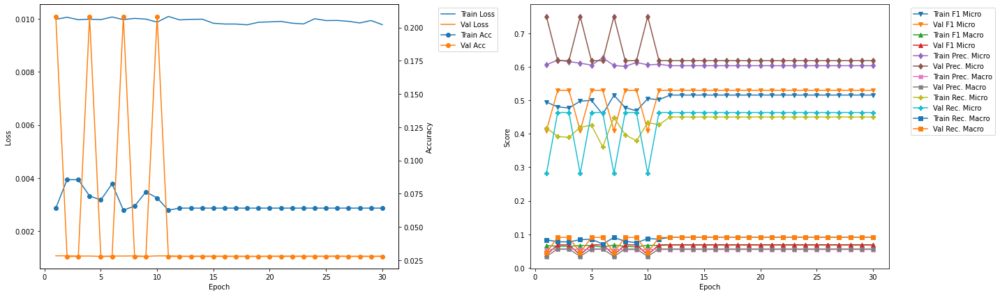

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.88
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.498 	Validation F1 Micro: 0.3602
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0359
Train Precision Mirco: 0.6049 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0297
Train Recall Mirco: 0.4232 	Validation Recall Micro: 0.2487
Train Recall Marco: 0.085 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.02
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.125
Train F1 Mirco: 0.477 	Validation F1 Micro: 0.5345
Train F1 Marco: 0.0643 	Validation F1 Macro: 0.0694
Train Precision Mirco: 0.6249 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0558 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.3857 	V

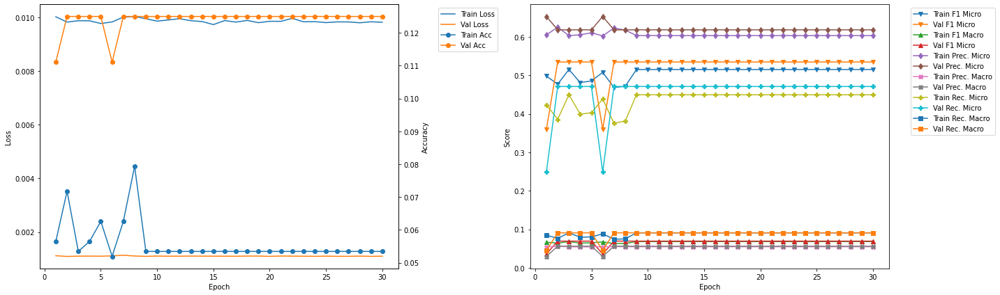

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 1 	Epoch: 4
Train Loss: 0.0118 	Validation Loss: 0.0011
Train Accuracy: 0.0168 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.1279 	Validation F1 Micro: 0.5559
Train F1 Marco: 0.023 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6058 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.0715 	Validation Recall Micro: 0.4973
Train Recall Marco: 0.0145 	Validation Recall Macro: 0.0909


In [20]:
resnet50LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = resnet50LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0157 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0615 	Validation F1 Micro: 0.0
Train F1 Marco: 0.036 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1219 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1073 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0411 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0257 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.32
Train Loss: 0.0126 	Validation Loss: 0.0012
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

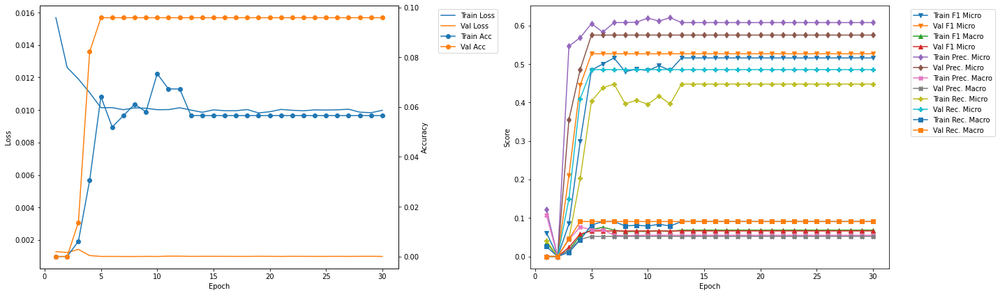

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.93
Train Loss: 0.0119 	Validation Loss: 0.0012
Train Accuracy: 0.0275 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2519 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0542 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.495 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0782 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1689 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0436 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.09
Train Loss: 0.0108 	Validation Loss: 0.0011
Train Accuracy: 0.0382 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.3782 	Validation F1 Micro: 0.5194
Train F1 Marco: 0.0547 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.5882 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.2787 	Validation Recall Micr

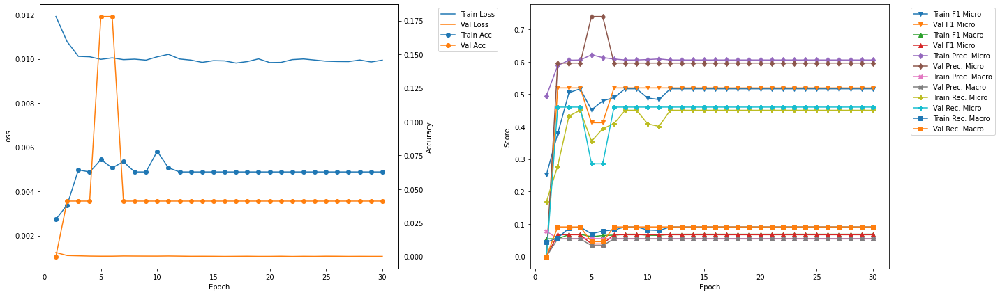

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.66
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4816 	Validation F1 Micro: 0.5151
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.071
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0538 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.4022 	Validation Recall Micro: 0.4292
Train Recall Marco: 0.0793 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.82
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4939 	Validation F1 Micro: 0.5151
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.071
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.4196 	Va

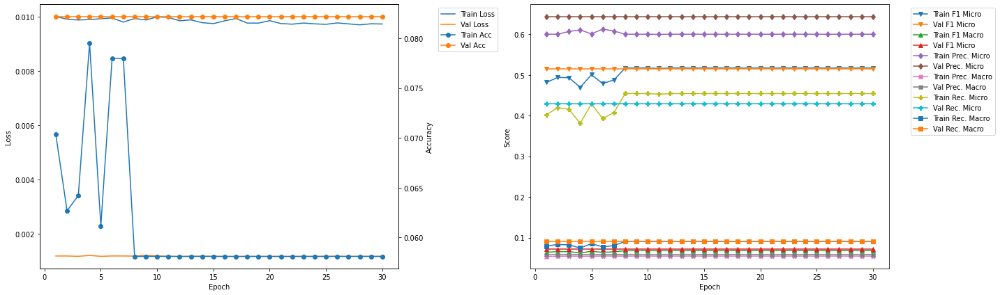

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.4
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4794 	Validation F1 Micro: 0.5251
Train F1 Marco: 0.0643 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6108 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3945 	Validation Recall Micro: 0.4611
Train Recall Marco: 0.0783 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.56
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.516 	Validation F1 Micro: 0.5251
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4504 	V

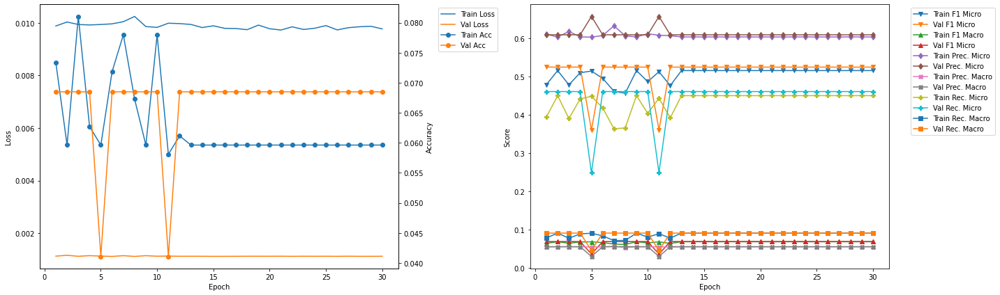

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.526646 --> 0.532934).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 19.15
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.466 	Validation F1 Micro: 0.5329
Train F1 Marco: 0.0625 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.6029 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0535 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3798 	Validation Recall Micro: 0.4734
Train Recall Marco: 0.0752 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.31
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0352 	Validation Accuracy: 0.0
Train F1 Mirco: 0.319 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0721 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4946 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1

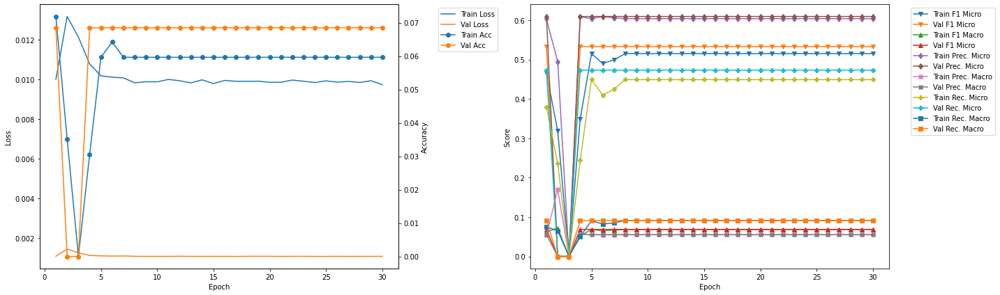

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.88
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5165 	Validation F1 Micro: 0.521
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4503 	Validation Recall Micro: 0.4628
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.04
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5165 	Validation F1 Micro: 0.521
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4503 	

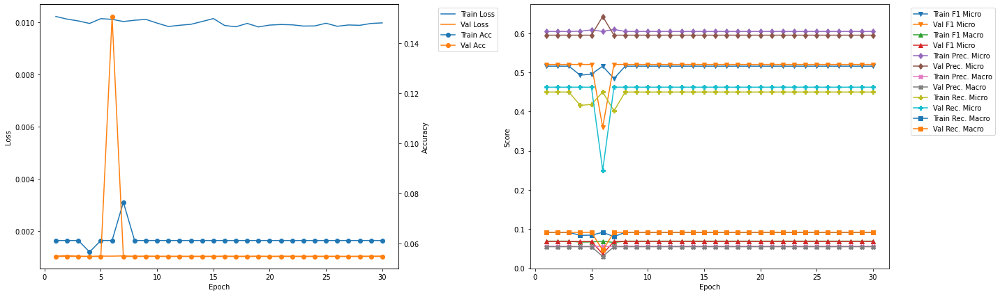

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.532934 --> 0.537468).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 28.63
Train Loss: 0.01 	Validation Loss: 0.0013
Train Accuracy: 0.081 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4624 	Validation F1 Micro: 0.5375
Train F1 Marco: 0.0614 	Validation F1 Macro: 0.0756
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.7123
Train Precision Marco: 0.0534 	Validation Precision Macro: 0.0648
Train Recall Mirco: 0.3746 	Validation Recall Micro: 0.4315
Train Recall Marco: 0.073 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.79
Train Loss: 0.0099 	Validation Loss: 0.0013
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5143 	Validation F1 Micro: 0.5375
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0756
Train Precision Mirco: 0.5925 	Validation Precision Micro: 0.7123
Train Precision

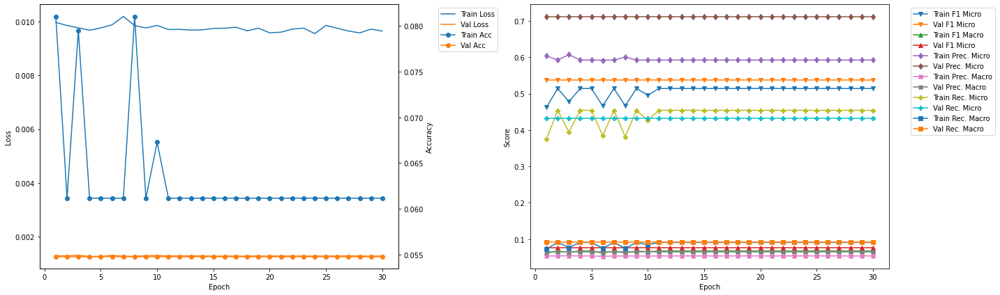

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.38
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0702 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4848 	Validation F1 Micro: 0.497
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6341 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0567 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.3925 	Validation Recall Micro: 0.433
Train Recall Marco: 0.0771 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.54
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0656 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4929 	Validation F1 Micro: 0.497
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.611 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.413 	Valid

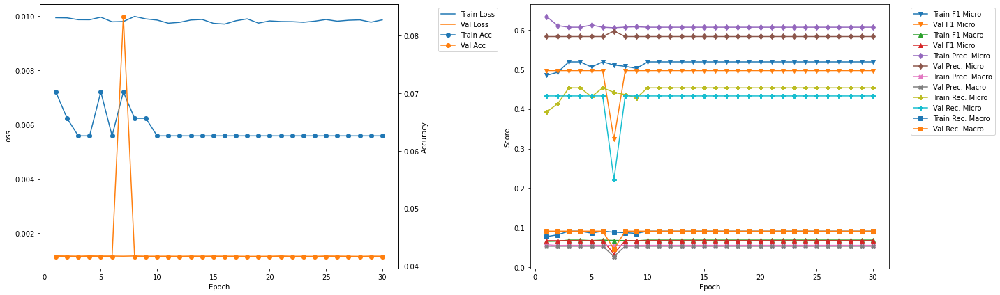

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.12
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4782 	Validation F1 Micro: 0.4941
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.6079 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.059 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.3941 	Validation Recall Micro: 0.4286
Train Recall Marco: 0.0787 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.27
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5194 	Validation F1 Micro: 0.4941
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.454 	Va

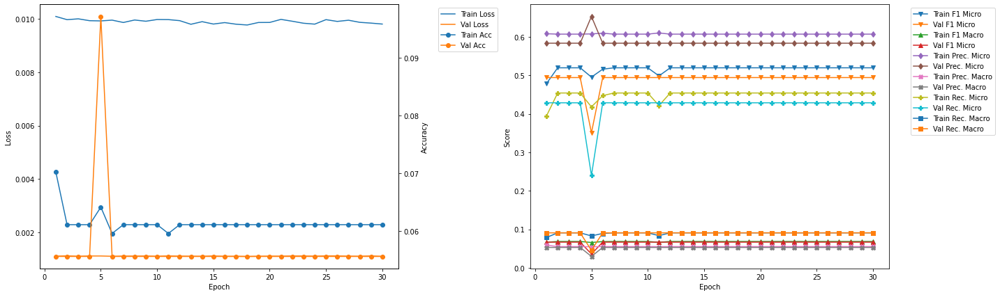

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.85
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5189 	Validation F1 Micro: 0.4968
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0629
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.5347
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4503 	Validation Recall Micro: 0.4639
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.01
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5189 	Validation F1 Micro: 0.4968
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0629
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.5347
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4503 	V

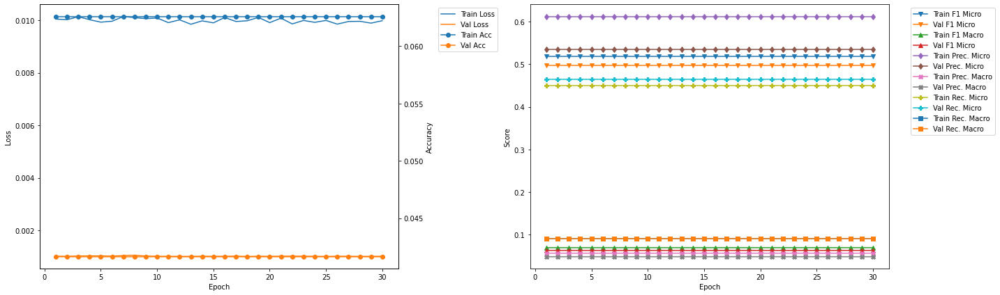

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 7 	Epoch: 1
Train Loss: 0.01 	Validation Loss: 0.0013
Train Accuracy: 0.081 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4624 	Validation F1 Micro: 0.5375
Train F1 Marco: 0.0614 	Validation F1 Macro: 0.0756
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.7123
Train Precision Marco: 0.0534 	Validation Precision Macro: 0.0648
Train Recall Mirco: 0.3746 	Validation Recall Micro: 0.4315
Train Recall Marco: 0.073 	Validation Recall Macro: 0.0909


In [21]:
resnet101LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = resnet101LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.15
Train Loss: 0.0165 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0523 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0363 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1237 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1106 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0331 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0295 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0124 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

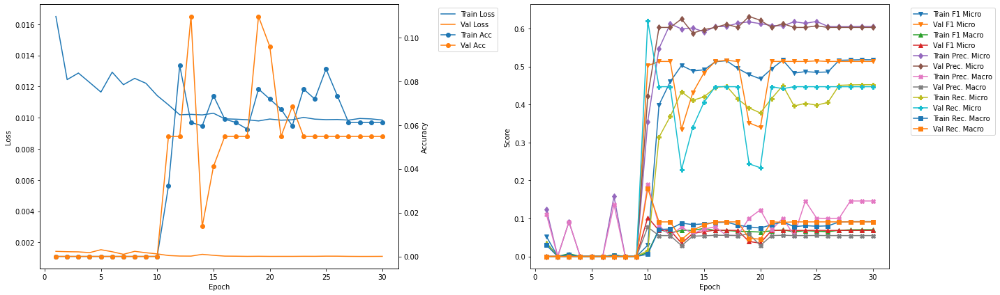

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.59
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4769 	Validation F1 Micro: 0.3485
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0351
Train Precision Mirco: 0.6088 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.1465 	Validation Precision Macro: 0.0294
Train Recall Mirco: 0.392 	Validation Recall Micro: 0.2396
Train Recall Marco: 0.0797 	Validation Recall Macro: 0.0436

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.74
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4947 	Validation F1 Micro: 0.3623
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0393
Train Precision Mirco: 0.596 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0997 	Validation Precision Macro: 0.0749
Train Recall Mirco: 0.4228 	Val

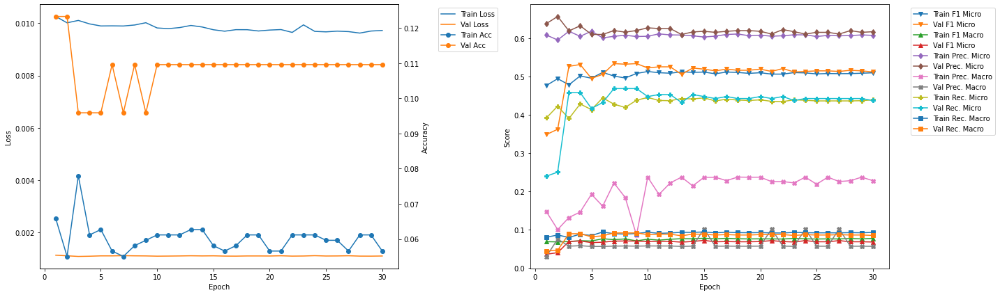

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.04
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4854 	Validation F1 Micro: 0.4795
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0902
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.5775
Train Precision Marco: 0.0773 	Validation Precision Macro: 0.2033
Train Recall Mirco: 0.4047 	Validation Recall Micro: 0.41
Train Recall Marco: 0.081 	Validation Recall Macro: 0.0996

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.19
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5005 	Validation F1 Micro: 0.4661
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0641
Train Precision Mirco: 0.6104 	Validation Precision Micro: 0.5683
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0513
Train Recall Mirco: 0.4242 	Val

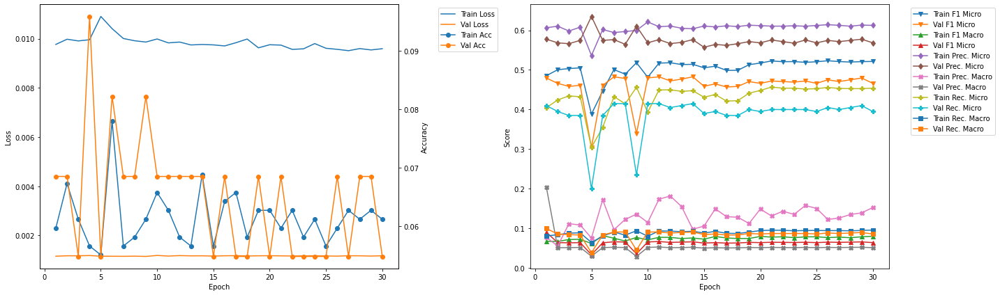

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 13.46
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5035 	Validation F1 Micro: 0.5244
Train F1 Marco: 0.0752 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.609 	Validation Precision Micro: 0.5931
Train Precision Marco: 0.1505 	Validation Precision Macro: 0.0539
Train Recall Mirco: 0.4291 	Validation Recall Micro: 0.4699
Train Recall Marco: 0.0896 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.6
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4828 	Validation F1 Micro: 0.2892
Train F1 Marco: 0.0714 	Validation F1 Macro: 0.0312
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.5455
Train Precision Marco: 0.204 	Validation Precision Macro: 0.0248
Train Recall Mirco: 0.4025 	

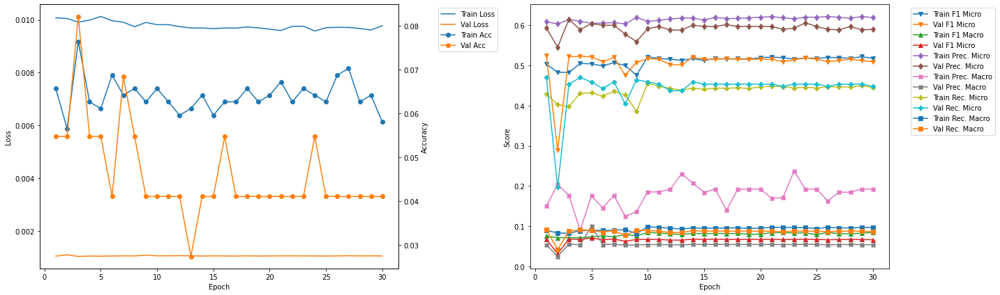

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.87
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4862 	Validation F1 Micro: 0.5056
Train F1 Marco: 0.0762 	Validation F1 Macro: 0.0866
Train Precision Mirco: 0.6045 	Validation Precision Micro: 0.6207
Train Precision Marco: 0.1477 	Validation Precision Macro: 0.127
Train Recall Mirco: 0.4067 	Validation Recall Micro: 0.4265
Train Recall Marco: 0.086 	Validation Recall Macro: 0.0947

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.02
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4978 	Validation F1 Micro: 0.4272
Train F1 Marco: 0.0698 	Validation F1 Macro: 0.0761
Train Precision Mirco: 0.6016 	Validation Precision Micro: 0.6735
Train Precision Marco: 0.1158 	Validation Precision Macro: 0.1481
Train Recall Mirco: 0.4245 	

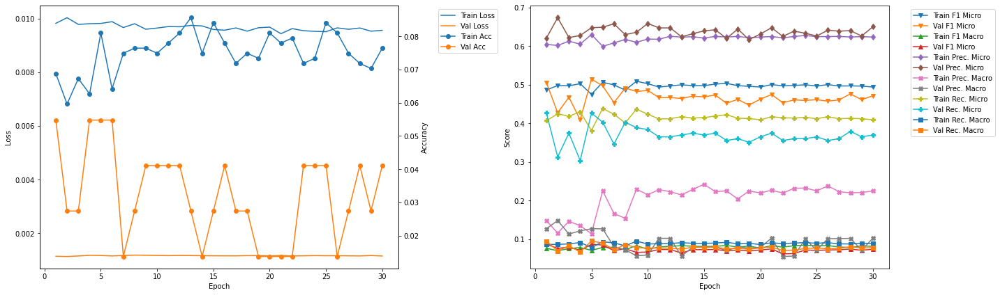

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.28
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4913 	Validation F1 Micro: 0.5103
Train F1 Marco: 0.0773 	Validation F1 Macro: 0.0758
Train Precision Mirco: 0.625 	Validation Precision Micro: 0.5878
Train Precision Marco: 0.2071 	Validation Precision Macro: 0.0656
Train Recall Mirco: 0.4048 	Validation Recall Micro: 0.4508
Train Recall Marco: 0.0856 	Validation Recall Macro: 0.0963

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.43
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5134 	Validation F1 Micro: 0.5179
Train F1 Marco: 0.0804 	Validation F1 Macro: 0.0785
Train Precision Mirco: 0.6092 	Validation Precision Micro: 0.6084
Train Precision Marco: 0.2523 	Validation Precision Macro: 0.0781
Train Recall Mirco: 0.443

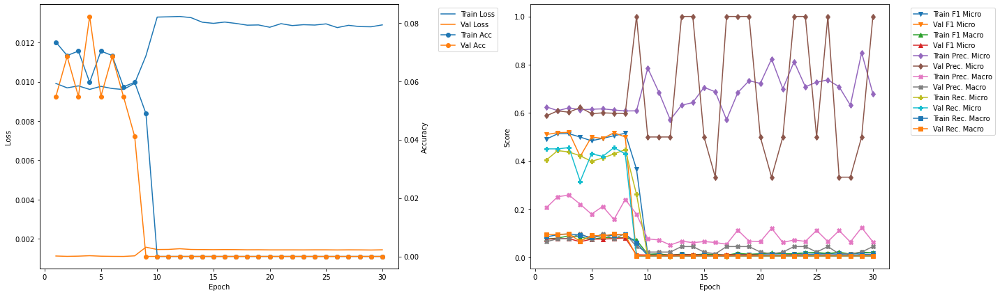

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.7
Train Loss: 0.0133 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.008 	Validation F1 Micro: 0.0091
Train F1 Marco: 0.0094 	Validation F1 Macro: 0.0076
Train Precision Mirco: 0.6364 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0649 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.004 	Validation Recall Micro: 0.0046
Train Recall Marco: 0.0051 	Validation Recall Macro: 0.0041

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.85
Train Loss: 0.0129 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0148 	Validation F1 Micro: 0.009
Train F1 Marco: 0.0161 	Validation F1 Macro: 0.0065
Train Precision Mirco: 0.5909 	Validation Precision Micro: 0.3333
Train Precision Marco: 0.0563 	Validation Precision Macro: 0.0152
Train Recall Mirco: 0.0075 	Validation Reca

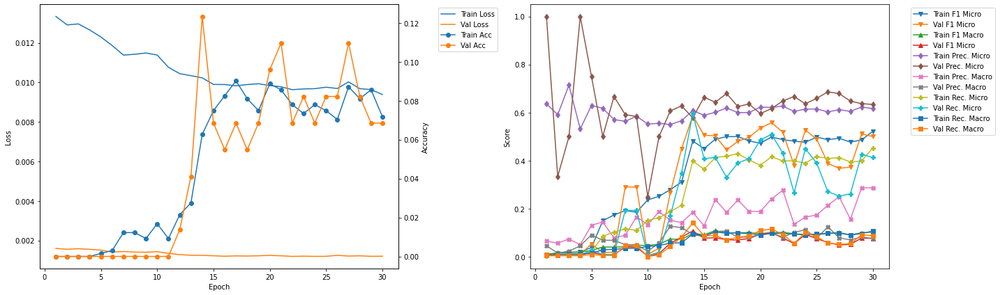

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.12
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4902 	Validation F1 Micro: 0.4953
Train F1 Marco: 0.095 	Validation F1 Macro: 0.0896
Train Precision Mirco: 0.5968 	Validation Precision Micro: 0.5486
Train Precision Marco: 0.2037 	Validation Precision Macro: 0.1552
Train Recall Mirco: 0.4159 	Validation Recall Micro: 0.4514
Train Recall Marco: 0.0963 	Validation Recall Macro: 0.1037

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.27
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.506 	Validation F1 Micro: 0.4908
Train F1 Marco: 0.0971 	Validation F1 Macro: 0.0816
Train Precision Mirco: 0.6157 	Validation Precision Micro: 0.5298
Train Precision Marco: 0.1854 	Validation Precision Macro: 0.0907
Train Recall Mirco: 0.4295

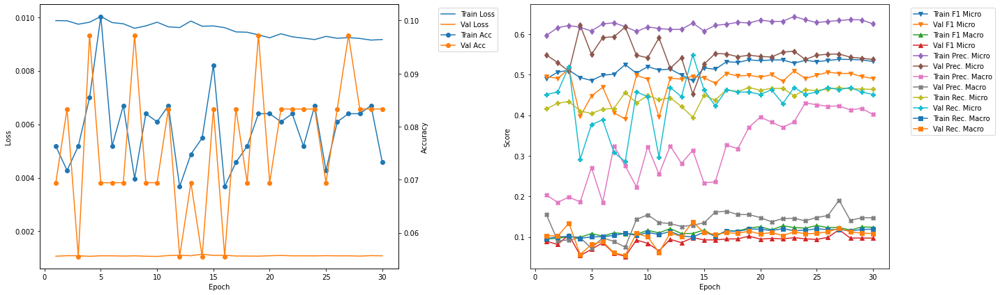

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 35.53
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0611 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4987 	Validation F1 Micro: 0.5526
Train F1 Marco: 0.1162 	Validation F1 Macro: 0.0963
Train Precision Mirco: 0.6126 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.3467 	Validation Precision Macro: 0.1323
Train Recall Mirco: 0.4205 	Validation Recall Micro: 0.492
Train Recall Marco: 0.1077 	Validation Recall Macro: 0.1081

Epoch 2 	Learning Rate: 0.01 	Time (min): 35.68
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0733 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5143 	Validation F1 Micro: 0.537
Train F1 Marco: 0.1081 	Validation F1 Macro: 0.0926
Train Precision Mirco: 0.618 	Validation Precision Micro: 0.635
Train Precision Marco: 0.3594 	Validation Precision Macro: 0.1291
Train Recall Mirco: 0.4403 	Va

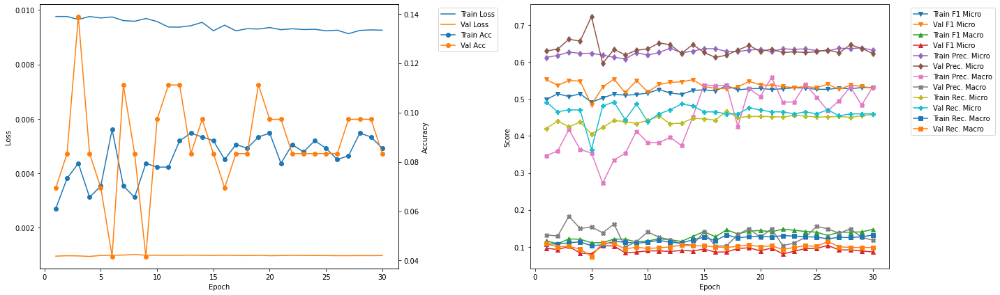

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.95
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0885 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.495 	Validation F1 Micro: 0.515
Train F1 Marco: 0.1118 	Validation F1 Macro: 0.0883
Train Precision Mirco: 0.6284 	Validation Precision Micro: 0.6014
Train Precision Marco: 0.3136 	Validation Precision Macro: 0.1236
Train Recall Mirco: 0.4083 	Validation Recall Micro: 0.4503
Train Recall Marco: 0.1023 	Validation Recall Macro: 0.099

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.1
Train Loss: 0.0095 	Validation Loss: 0.0011
Train Accuracy: 0.084 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4877 	Validation F1 Micro: 0.4875
Train F1 Marco: 0.112 	Validation F1 Macro: 0.0832
Train Precision Mirco: 0.6238 	Validation Precision Micro: 0.6047
Train Precision Marco: 0.3931 	Validation Precision Macro: 0.101
Train Recall Mirco: 0.4003 	Va

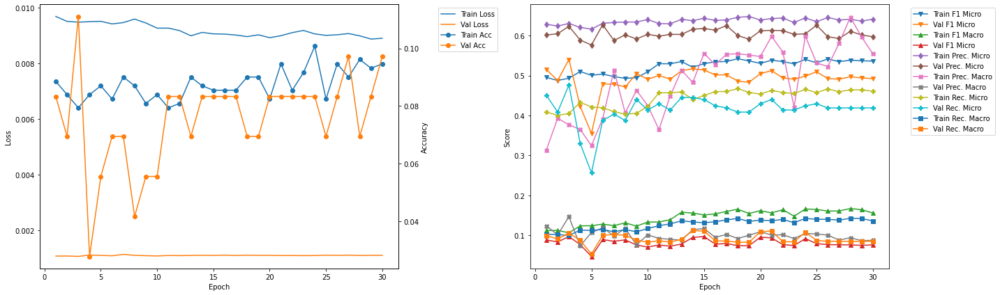

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 7 	Epoch: 14
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4816 	Validation F1 Micro: 0.5869
Train F1 Marco: 0.097 	Validation F1 Macro: 0.1067
Train Precision Mirco: 0.6087 	Validation Precision Micro: 0.5778
Train Precision Marco: 0.1847 	Validation Precision Macro: 0.0921
Train Recall Mirco: 0.3985 	Validation Recall Micro: 0.5963
Train Recall Marco: 0.0942 	Validation Recall Macro: 0.1405


In [22]:
densenet121LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = densenet121LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0168 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.054 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0404 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1274 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1238 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0343 	Validation Recall Micro: 0.0
Train Recall Marco: 0.03 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.33
Train Loss: 0.0129 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

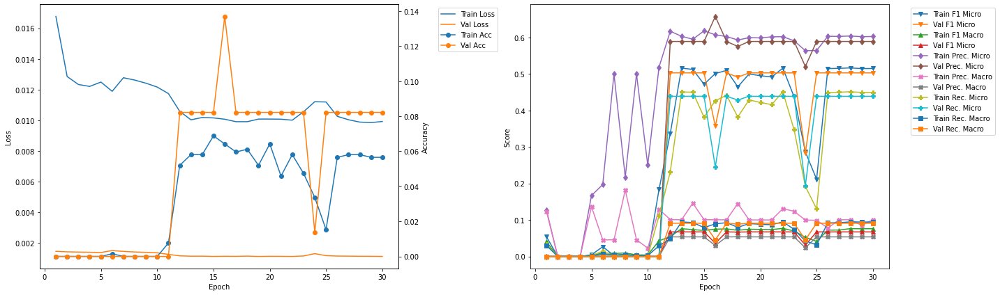

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.11
Train Loss: 0.0109 	Validation Loss: 0.0012
Train Accuracy: 0.0382 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4 	Validation F1 Micro: 0.415
Train F1 Marco: 0.0627 	Validation F1 Macro: 0.0563
Train Precision Mirco: 0.5789 	Validation Precision Micro: 0.5495
Train Precision Marco: 0.0725 	Validation Precision Macro: 0.0493
Train Recall Mirco: 0.3056 	Validation Recall Micro: 0.3333
Train Recall Marco: 0.0644 	Validation Recall Macro: 0.0659

Validation F1 Micro Score Increased (0.502924 --> 0.504559).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.28
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.472 	Validation F1 Micro: 0.5046
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.0655
Train Precision Mirco: 0.6159 	Validation Precision Micro: 0.5685
Train Precision Ma

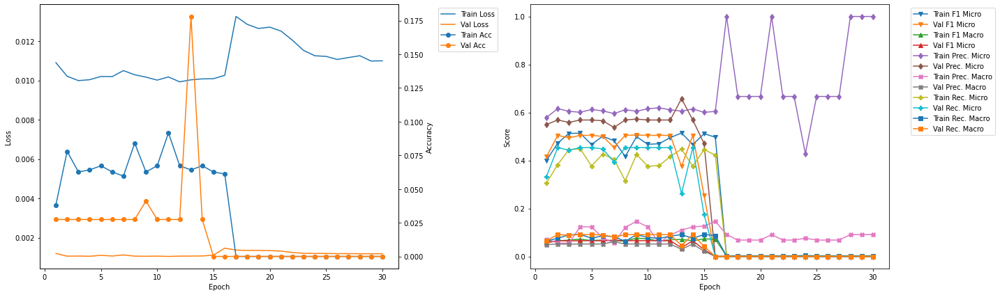

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.05
Train Loss: 0.0115 	Validation Loss: 0.0013
Train Accuracy: 0.0076 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.1016 	Validation F1 Micro: 0.2707
Train F1 Marco: 0.0253 	Validation F1 Macro: 0.0303
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.5217
Train Precision Marco: 0.1258 	Validation Precision Macro: 0.0237
Train Recall Mirco: 0.0566 	Validation Recall Micro: 0.1827
Train Recall Marco: 0.0181 	Validation Recall Macro: 0.042

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.22
Train Loss: 0.0106 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4239 	Validation F1 Micro: 0.4751
Train F1 Marco: 0.0608 	Validation F1 Macro: 0.0649
Train Precision Mirco: 0.6344 	Validation Precision Micro: 0.5625
Train Precision Marco: 0.1024 	Validation Precision Macro: 0.0512
Train Recall Mirco: 0.3183 	

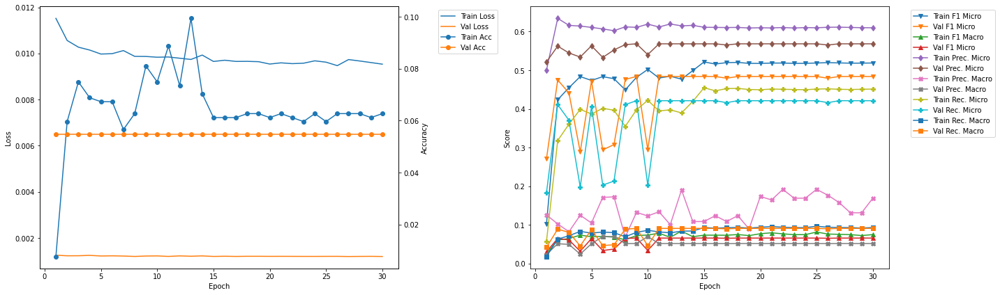

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.98
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4765 	Validation F1 Micro: 0.4479
Train F1 Marco: 0.071 	Validation F1 Macro: 0.0588
Train Precision Mirco: 0.6289 	Validation Precision Micro: 0.5145
Train Precision Marco: 0.1474 	Validation Precision Macro: 0.0464
Train Recall Mirco: 0.3835 	Validation Recall Micro: 0.3966
Train Recall Marco: 0.0787 	Validation Recall Macro: 0.081

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.14
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4894 	Validation F1 Micro: 0.463
Train F1 Marco: 0.0709 	Validation F1 Macro: 0.0614
Train Precision Mirco: 0.6222 	Validation Precision Micro: 0.5172
Train Precision Marco: 0.1242 	Validation Precision Macro: 0.048
Train Recall Mirco: 0.4033 	

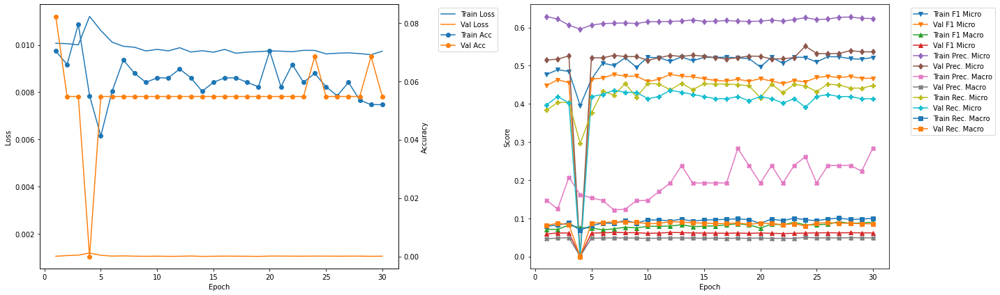

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.91
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0734 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4396 	Validation F1 Micro: 0.4602
Train F1 Marco: 0.0759 	Validation F1 Macro: 0.0642
Train Precision Mirco: 0.5924 	Validation Precision Micro: 0.5778
Train Precision Marco: 0.1867 	Validation Precision Macro: 0.0531
Train Recall Mirco: 0.3494 	Validation Recall Micro: 0.3824
Train Recall Marco: 0.0749 	Validation Recall Macro: 0.0812

Epoch 2 	Learning Rate: 0.01 	Time (min): 20.07
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.5015 	Validation F1 Micro: 0.4781
Train F1 Marco: 0.0874 	Validation F1 Macro: 0.0659
Train Precision Mirco: 0.5998 	Validation Precision Micro: 0.5899
Train Precision Marco: 0.2011 	Validation Precision Macro: 0.0536
Train Recall Mirco: 0.43

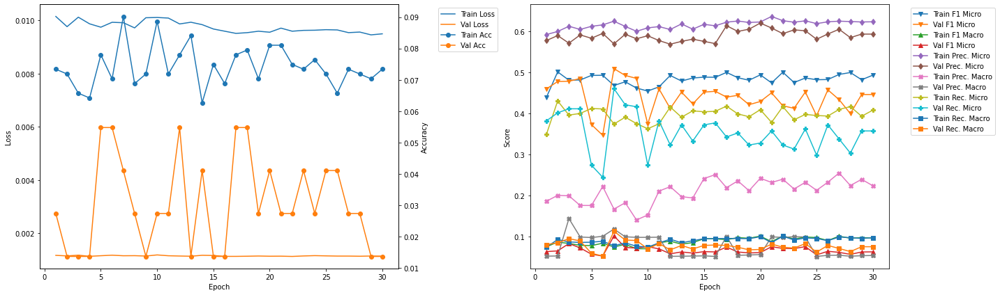

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.84
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.49 	Validation F1 Micro: 0.2778
Train F1 Marco: 0.0991 	Validation F1 Macro: 0.0331
Train Precision Mirco: 0.602 	Validation Precision Micro: 0.7292
Train Precision Marco: 0.2375 	Validation Precision Macro: 0.0331
Train Recall Mirco: 0.4131 	Validation Recall Micro: 0.1716
Train Recall Marco: 0.0984 	Validation Recall Macro: 0.0331

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.01
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4324 	Validation F1 Micro: 0.4927
Train F1 Marco: 0.0741 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.6096 	Validation Precision Micro: 0.6131
Train Precision Marco: 0.1795 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.3351 	V

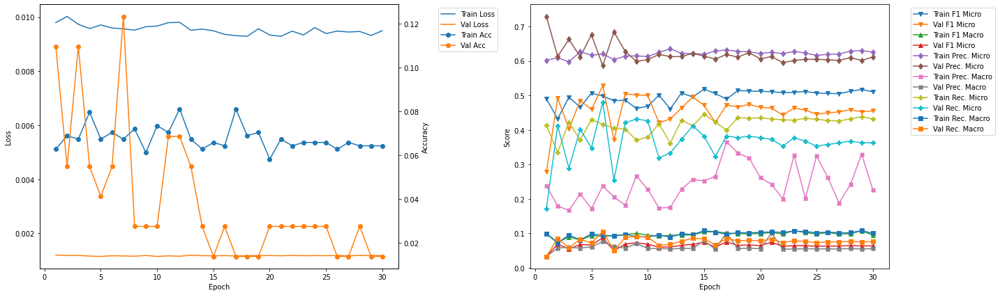

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.77
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4746 	Validation F1 Micro: 0.5202
Train F1 Marco: 0.0894 	Validation F1 Macro: 0.1029
Train Precision Mirco: 0.5957 	Validation Precision Micro: 0.6294
Train Precision Marco: 0.1668 	Validation Precision Macro: 0.115
Train Recall Mirco: 0.3945 	Validation Recall Micro: 0.4433
Train Recall Marco: 0.089 	Validation Recall Macro: 0.112

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.94
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.499 	Validation F1 Micro: 0.497
Train F1 Marco: 0.078 	Validation F1 Macro: 0.0959
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.6457
Train Precision Marco: 0.13 	Validation Precision Macro: 0.1081
Train Recall Mirco: 0.4266 	Validat

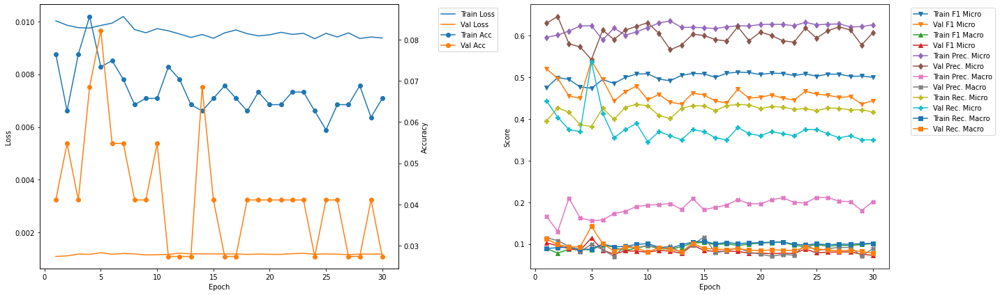

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.7
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4726 	Validation F1 Micro: 0.5096
Train F1 Marco: 0.0902 	Validation F1 Macro: 0.1161
Train Precision Mirco: 0.6007 	Validation Precision Micro: 0.708
Train Precision Marco: 0.1714 	Validation Precision Macro: 0.155
Train Recall Mirco: 0.3895 	Validation Recall Micro: 0.398
Train Recall Marco: 0.0901 	Validation Recall Macro: 0.1048

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.86
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4653 	Validation F1 Micro: 0.5127
Train F1 Marco: 0.092 	Validation F1 Macro: 0.1033
Train Precision Mirco: 0.6251 	Validation Precision Micro: 0.7043
Train Precision Marco: 0.1862 	Validation Precision Macro: 0.1312
Train Recall Mirco: 0.3706 	V

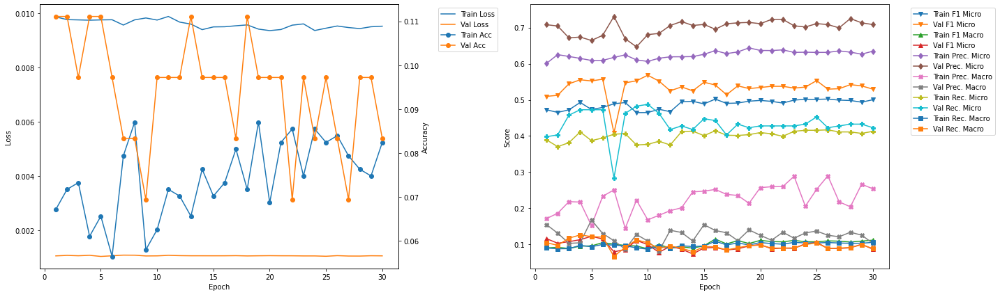

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.65
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0702 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4747 	Validation F1 Micro: 0.1759
Train F1 Marco: 0.094 	Validation F1 Macro: 0.0249
Train Precision Mirco: 0.6137 	Validation Precision Micro: 0.7308
Train Precision Marco: 0.1413 	Validation Precision Macro: 0.0724
Train Recall Mirco: 0.387 	Validation Recall Micro: 0.1
Train Recall Marco: 0.0918 	Validation Recall Macro: 0.0161

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.81
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4471 	Validation F1 Micro: 0.4775
Train F1 Marco: 0.0986 	Validation F1 Macro: 0.108
Train Precision Mirco: 0.6117 	Validation Precision Micro: 0.697
Train Precision Marco: 0.2301 	Validation Precision Macro: 0.1387
Train Recall Mirco: 0.3523 	Validat

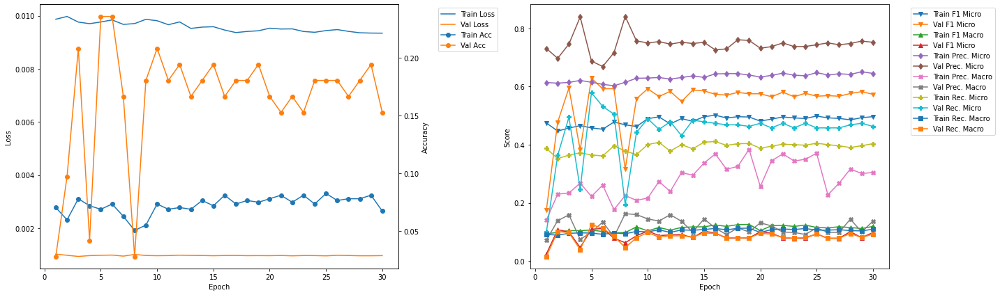

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.59
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4879 	Validation F1 Micro: 0.5
Train F1 Marco: 0.1071 	Validation F1 Macro: 0.0955
Train Precision Mirco: 0.6236 	Validation Precision Micro: 0.5845
Train Precision Marco: 0.2104 	Validation Precision Macro: 0.1351
Train Recall Mirco: 0.4007 	Validation Recall Micro: 0.4368
Train Recall Marco: 0.101 	Validation Recall Macro: 0.1026

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.75
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5163 	Validation F1 Micro: 0.5
Train F1 Marco: 0.1141 	Validation F1 Macro: 0.0838
Train Precision Mirco: 0.6225 	Validation Precision Micro: 0.5942
Train Precision Marco: 0.2143 	Validation Precision Macro: 0.1297
Train Recall Mirco: 0.4411 	Va

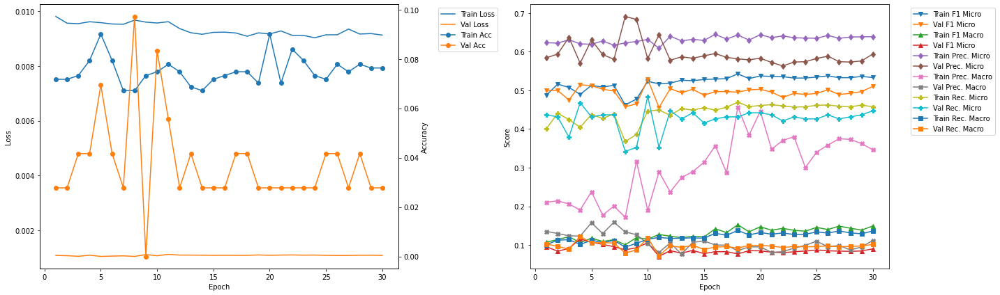

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 9 	Epoch: 5
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0687 	Validation Accuracy: 0.2361
Train F1 Mirco: 0.4579 	Validation F1 Micro: 0.6286
Train F1 Marco: 0.1067 	Validation F1 Macro: 0.1095
Train Precision Mirco: 0.6146 	Validation Precision Micro: 0.6875
Train Precision Marco: 0.2225 	Validation Precision Macro: 0.099
Train Recall Mirco: 0.3648 	Validation Recall Micro: 0.5789
Train Recall Marco: 0.0965 	Validation Recall Macro: 0.1252


In [23]:
densenet169LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = densenet169LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet169LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.18
Train Loss: 0.0165 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0603 	Validation F1 Micro: 0.0
Train F1 Marco: 0.044 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1299 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1305 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0393 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0353 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.35
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0034 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0018 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1429 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1364 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0017 	Validation Recall Micro: 0.0
Train Recall

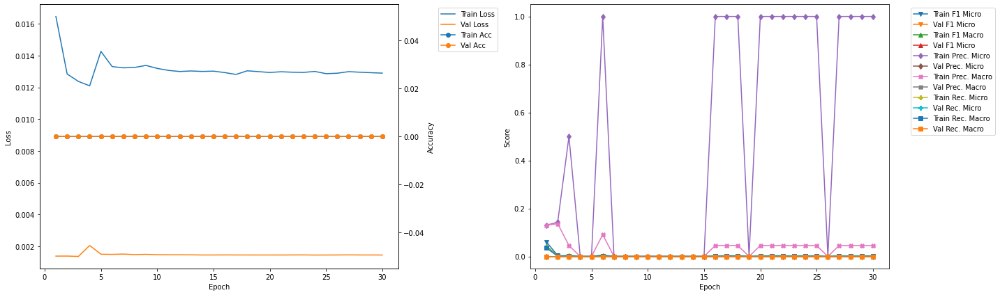

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.48
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0014 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.25 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0007 	Validation Recall Macro: 0.0

Validation F1 Micro Score Increased (0.000000 --> 0.334601).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.67
Train Loss: 0.0124 	Validation Loss: 0.0012
Train Accuracy: 0.0 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.3346
Train F1 Marco: 0.0027 	Validation F1 Macro: 0.0342
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0303 	Validation Pr

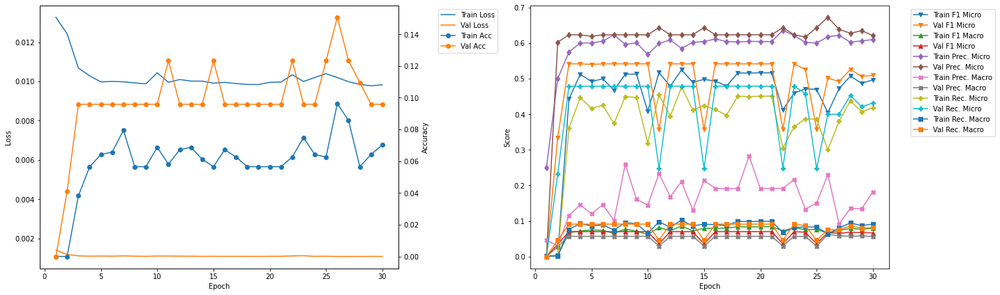

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.81
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.137
Train F1 Mirco: 0.4995 	Validation F1 Micro: 0.4015
Train F1 Marco: 0.0794 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.618
Train Precision Marco: 0.15 	Validation Precision Macro: 0.0972
Train Recall Mirco: 0.4251 	Validation Recall Micro: 0.2973
Train Recall Marco: 0.0911 	Validation Recall Macro: 0.0692

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.99
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5048 	Validation F1 Micro: 0.4909
Train F1 Marco: 0.0806 	Validation F1 Macro: 0.0878
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.5586
Train Precision Marco: 0.172 	Validation Precision Macro: 0.0982
Train Recall Mirco: 0.4336 	Vali

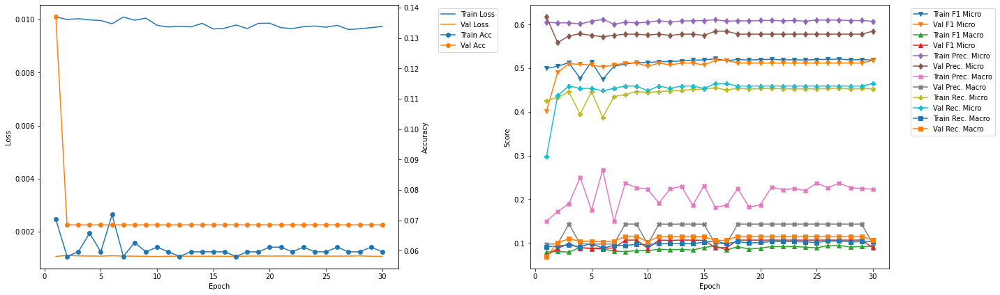

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 16.12
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4852 	Validation F1 Micro: 0.503
Train F1 Marco: 0.0744 	Validation F1 Macro: 0.0662
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.5915
Train Precision Marco: 0.1209 	Validation Precision Macro: 0.0538
Train Recall Mirco: 0.4051 	Validation Recall Micro: 0.4375
Train Recall Marco: 0.0855 	Validation Recall Macro: 0.0867

Epoch 2 	Learning Rate: 0.01 	Time (min): 16.3
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.516 	Validation F1 Micro: 0.506
Train F1 Marco: 0.0855 	Validation F1 Macro: 0.0775
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.1549 	Validation Precision Macro: 0.0992
Train Recall Mirco: 0.4496 	Va

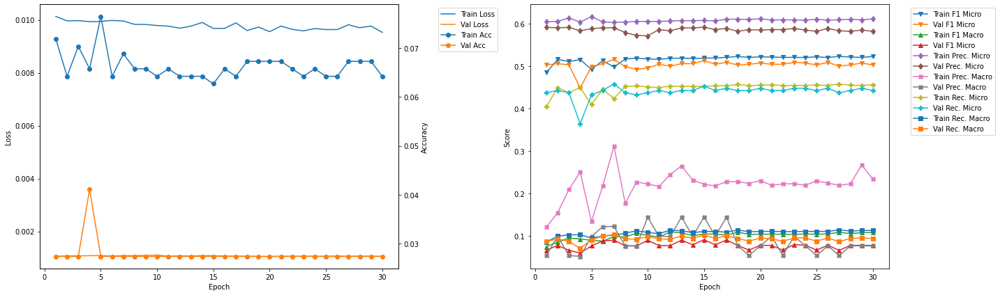

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.43
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4956 	Validation F1 Micro: 0.4727
Train F1 Marco: 0.0961 	Validation F1 Macro: 0.1094
Train Precision Mirco: 0.6159 	Validation Precision Micro: 0.5612
Train Precision Marco: 0.2629 	Validation Precision Macro: 0.1869
Train Recall Mirco: 0.4146 	Validation Recall Micro: 0.4084
Train Recall Marco: 0.0976 	Validation Recall Macro: 0.1115

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.61
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5065 	Validation F1 Micro: 0.4852
Train F1 Marco: 0.1024 	Validation F1 Macro: 0.1033
Train Precision Mirco: 0.6128 	Validation Precision Micro: 0.5578
Train Precision Marco: 0.2937 	Validation Precision Macro: 0.1419
Train Recall Mirco: 0.43

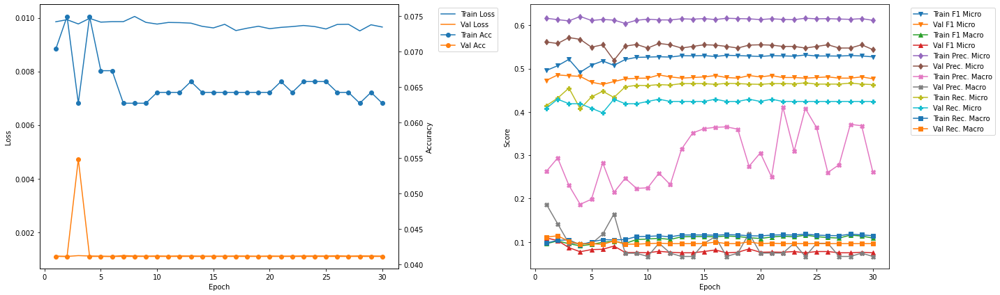

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.74
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5147 	Validation F1 Micro: 0.5349
Train F1 Marco: 0.0983 	Validation F1 Macro: 0.1231
Train Precision Mirco: 0.614 	Validation Precision Micro: 0.6013
Train Precision Marco: 0.2019 	Validation Precision Macro: 0.1794
Train Recall Mirco: 0.4431 	Validation Recall Micro: 0.4817
Train Recall Marco: 0.1045 	Validation Recall Macro: 0.1261

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.91
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5015 	Validation F1 Micro: 0.5263
Train F1 Marco: 0.0912 	Validation F1 Macro: 0.118
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.596
Train Precision Marco: 0.1876 	Validation Precision Macro: 0.1758
Train Recall Mirco: 0.4288 	V

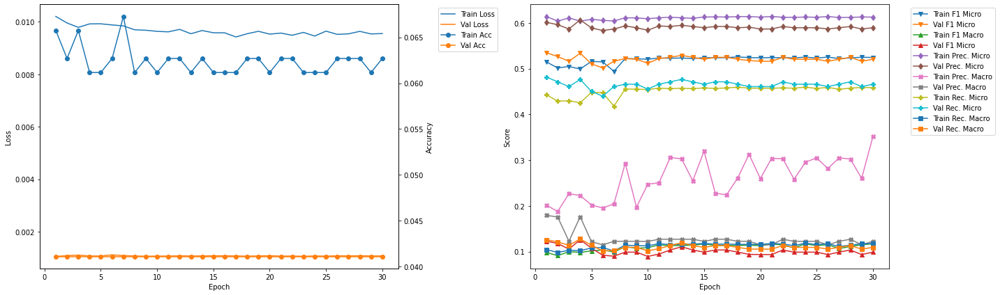

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.541667 --> 0.563536).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 32.05
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4933 	Validation F1 Micro: 0.5635
Train F1 Marco: 0.1067 	Validation F1 Macro: 0.1104
Train Precision Mirco: 0.6076 	Validation Precision Micro: 0.7183
Train Precision Marco: 0.252 	Validation Precision Macro: 0.2011
Train Recall Mirco: 0.4152 	Validation Recall Micro: 0.4636
Train Recall Marco: 0.105 	Validation Recall Macro: 0.1091

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.23
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4791 	Validation F1 Micro: 0.5565
Train F1 Marco: 0.1099 	Validation F1 Macro: 0.1066
Train Precision Mirco: 0.6077 	Validation Precision Micro: 0.7063
Train Precisi

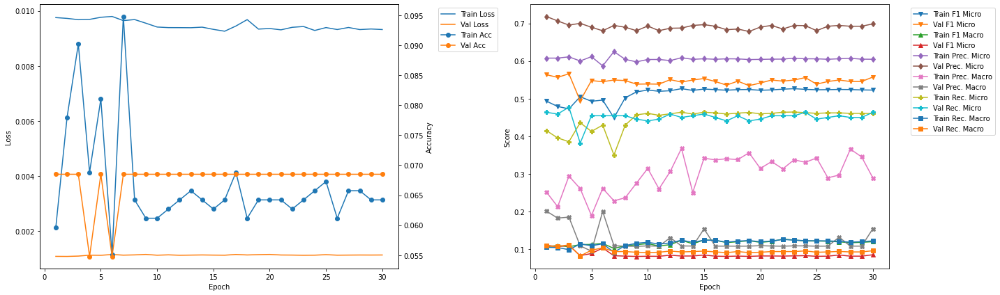

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.37
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4947 	Validation F1 Micro: 0.5503
Train F1 Marco: 0.1085 	Validation F1 Macro: 0.1578
Train Precision Mirco: 0.625 	Validation Precision Micro: 0.62
Train Precision Marco: 0.2088 	Validation Precision Macro: 0.2449
Train Recall Mirco: 0.4093 	Validation Recall Micro: 0.4947
Train Recall Marco: 0.1028 	Validation Recall Macro: 0.1634

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.54
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5277 	Validation F1 Micro: 0.5196
Train F1 Marco: 0.1161 	Validation F1 Macro: 0.1084
Train Precision Mirco: 0.6139 	Validation Precision Micro: 0.6014
Train Precision Marco: 0.2718 	Validation Precision Macro: 0.1611
Train Recall Mirco: 0.4628 

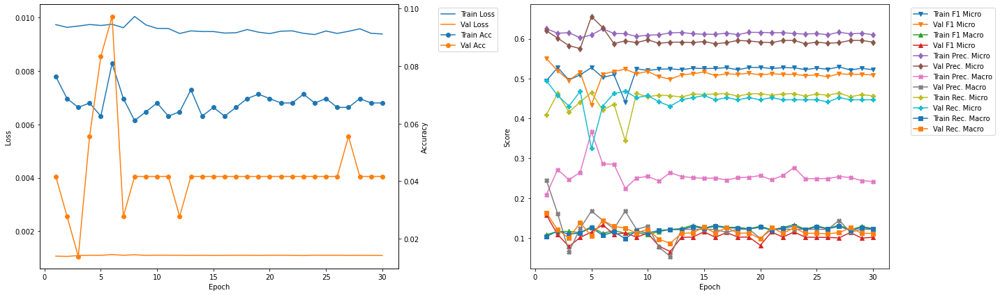

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.67
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0947 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.489 	Validation F1 Micro: 0.5181
Train F1 Marco: 0.1152 	Validation F1 Macro: 0.0937
Train Precision Mirco: 0.6306 	Validation Precision Micro: 0.6232
Train Precision Marco: 0.2508 	Validation Precision Macro: 0.1463
Train Recall Mirco: 0.3993 	Validation Recall Micro: 0.4433
Train Recall Marco: 0.1064 	Validation Recall Macro: 0.1019

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.84
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5131 	Validation F1 Micro: 0.5306
Train F1 Marco: 0.1268 	Validation F1 Macro: 0.0889
Train Precision Mirco: 0.6146 	Validation Precision Micro: 0.6107
Train Precision Marco: 0.2936 	Validation Precision Macro: 0.1162
Train Recall Mirco: 0.4404

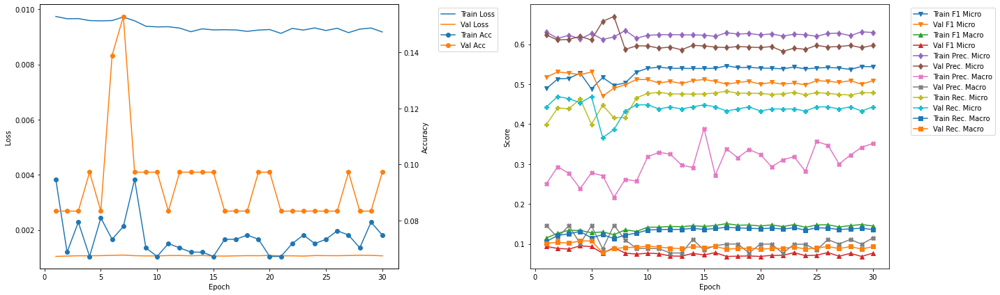

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 47.98
Train Loss: 0.0094 	Validation Loss: 0.0012
Train Accuracy: 0.0809 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5075 	Validation F1 Micro: 0.3574
Train F1 Marco: 0.1351 	Validation F1 Macro: 0.0575
Train Precision Mirco: 0.6265 	Validation Precision Micro: 0.6047
Train Precision Marco: 0.2751 	Validation Precision Macro: 0.0985
Train Recall Mirco: 0.4265 	Validation Recall Micro: 0.2537
Train Recall Marco: 0.1218 	Validation Recall Macro: 0.0583

Epoch 2 	Learning Rate: 0.01 	Time (min): 48.15
Train Loss: 0.0092 	Validation Loss: 0.0012
Train Accuracy: 0.0794 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5323 	Validation F1 Micro: 0.4478
Train F1 Marco: 0.1417 	Validation F1 Macro: 0.084
Train Precision Mirco: 0.6298 	Validation Precision Micro: 0.5769
Train Precision Marco: 0.2942 	Validation Precision Macro: 0.1203
Train Recall Mirco: 0.46

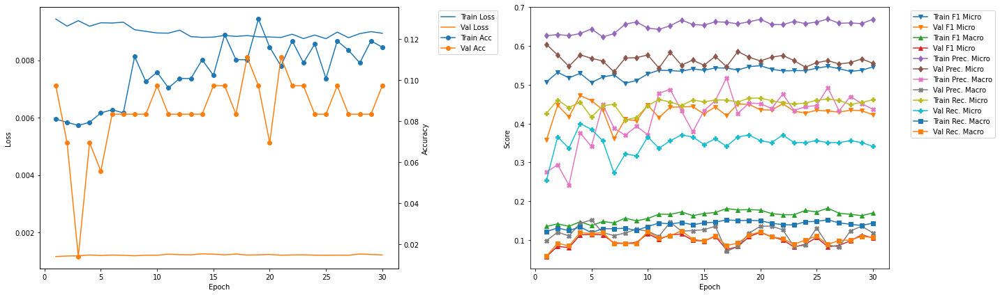

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 7 	Epoch: 3
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0902 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4728 	Validation F1 Micro: 0.566
Train F1 Marco: 0.1064 	Validation F1 Macro: 0.1104
Train Precision Mirco: 0.611 	Validation Precision Micro: 0.6954
Train Precision Marco: 0.2941 	Validation Precision Macro: 0.1852
Train Recall Mirco: 0.3856 	Validation Recall Micro: 0.4773
Train Recall Marco: 0.0987 	Validation Recall Macro: 0.1114


In [24]:
densenet201LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = densenet201LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.19
Train Loss: 0.0172 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0057 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0067 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.3125 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0029 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0036 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.38
Train Loss: 0.0126 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

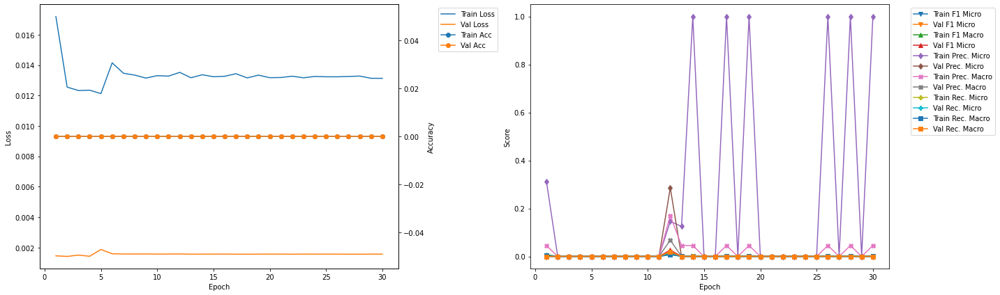

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.82
Train Loss: 0.0136 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.0
Train Loss: 0.0134 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Ma

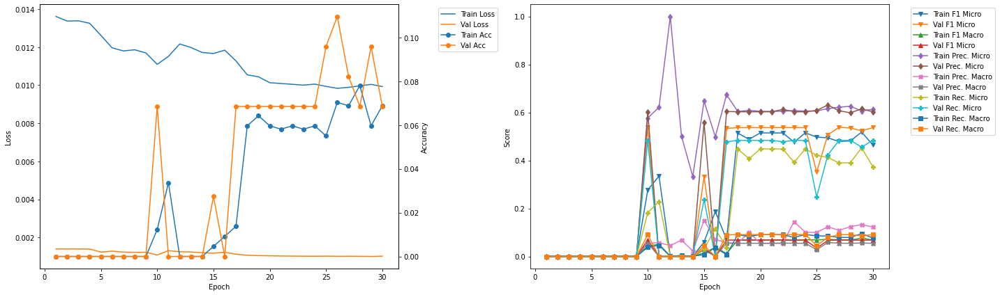

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.49
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4494 	Validation F1 Micro: 0.5181
Train F1 Marco: 0.0668 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.5888 	Validation Precision Micro: 0.589
Train Precision Marco: 0.087 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3634 	Validation Recall Micro: 0.4624
Train Recall Marco: 0.0742 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.68
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4713 	Validation F1 Micro: 0.5181
Train F1 Marco: 0.0721 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.5873 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0723 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3935 

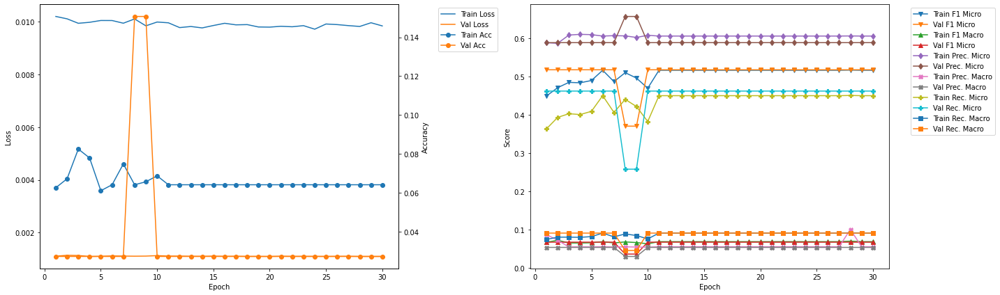

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.11
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4938 	Validation F1 Micro: 0.4681
Train F1 Marco: 0.0732 	Validation F1 Macro: 0.0619
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.5274
Train Precision Marco: 0.0732 	Validation Precision Macro: 0.0479
Train Recall Mirco: 0.4195 	Validation Recall Micro: 0.4208
Train Recall Marco: 0.0848 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.29
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5007 	Validation F1 Micro: 0.4681
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0619
Train Precision Mirco: 0.6233 	Validation Precision Micro: 0.5274
Train Precision Marco: 0.1016 	Validation Precision Macro: 0.0479
Train Recall Mirco: 0.41

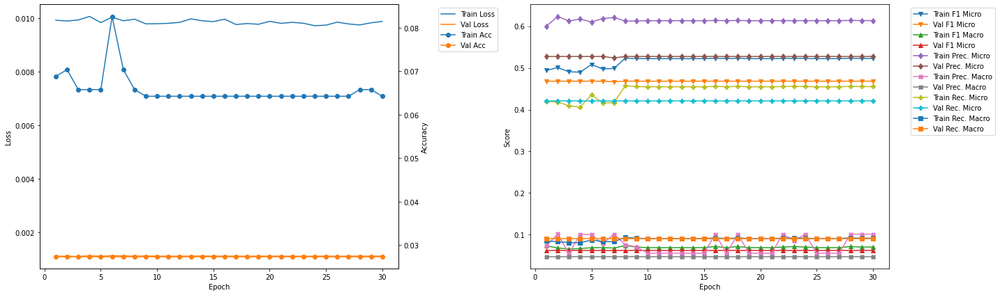

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.538226 --> 0.566265).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 22.74
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0826 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4883 	Validation F1 Micro: 0.5663
Train F1 Marco: 0.0741 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6071 	Validation Precision Micro: 0.6351
Train Precision Marco: 0.1113 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.4084 	Validation Recall Micro: 0.5109
Train Recall Marco: 0.0853 	Validation Recall Macro: 0.0909

Validation F1 Micro Score Increased (0.566265 --> 0.569697).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.94
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0627 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4992 	Validation F1 Micro: 0.5697
Train F1 Marco: 0.0695 	Validation F1 Macro: 0.071

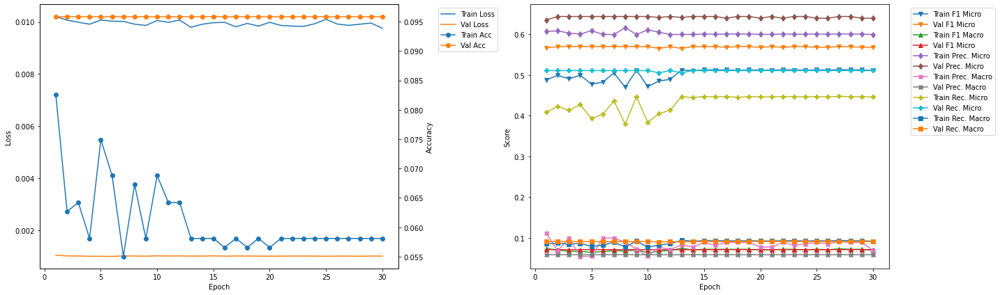

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.38
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0719 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4794 	Validation F1 Micro: 0.5319
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.0721
Train Precision Mirco: 0.5979 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0874 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.4001 	Validation Recall Micro: 0.4465
Train Recall Marco: 0.0809 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.56
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0749 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.487 	Validation F1 Micro: 0.3403
Train F1 Marco: 0.065 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.6074 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.4065 	

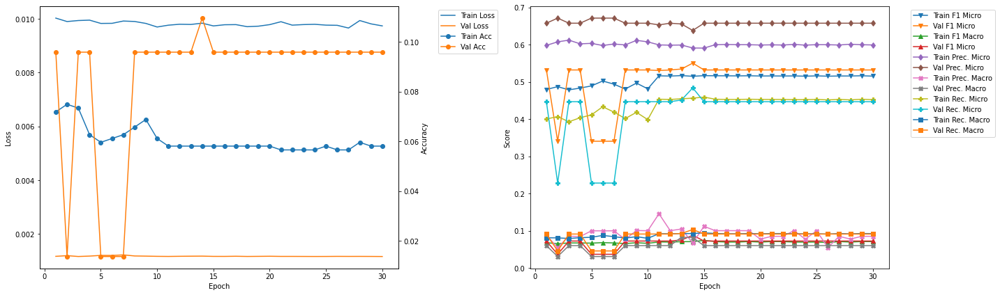

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.99
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0535 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4924 	Validation F1 Micro: 0.5289
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6066 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.07 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4144 	Validation Recall Micro: 0.4754
Train Recall Marco: 0.0837 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.18
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5061 	Validation F1 Micro: 0.5289
Train F1 Marco: 0.0699 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6054 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0776 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4348 	Vali

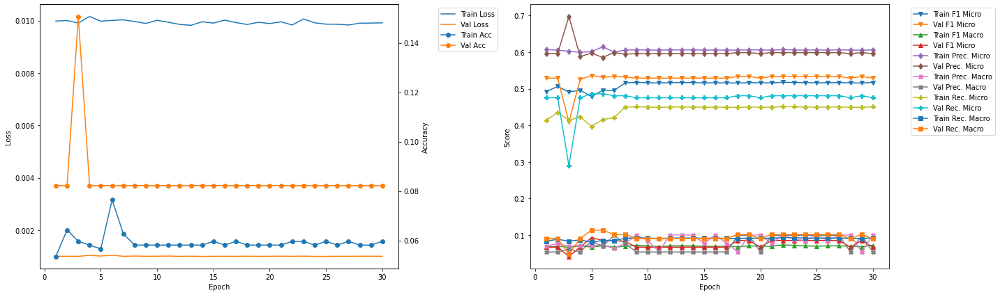

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.6
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0733 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4902 	Validation F1 Micro: 0.5281
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0936
Train Precision Mirco: 0.6084 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0662 	Validation Precision Macro: 0.1035
Train Recall Mirco: 0.4105 	Validation Recall Micro: 0.4476
Train Recall Marco: 0.0829 	Validation Recall Macro: 0.1061

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.79
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5054 	Validation F1 Micro: 0.3392
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.0489
Train Precision Mirco: 0.6093 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0703 	Validation Precision Macro: 0.0751
Train Recall Mirco: 0.4318 

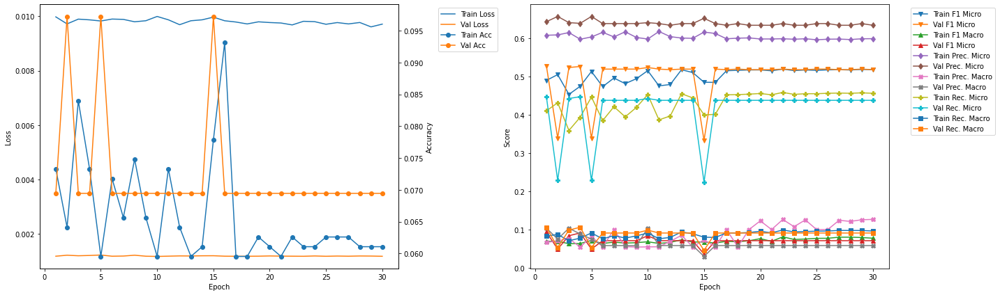

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.22
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5259 	Validation F1 Micro: 0.4696
Train F1 Marco: 0.0774 	Validation F1 Macro: 0.0783
Train Precision Mirco: 0.606 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0929 	Validation Precision Macro: 0.0953
Train Recall Mirco: 0.4645 	Validation Recall Micro: 0.407
Train Recall Marco: 0.0959 	Validation Recall Macro: 0.0992

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.4
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5123 	Validation F1 Micro: 0.3297
Train F1 Marco: 0.0691 	Validation F1 Macro: 0.048
Train Precision Mirco: 0.6121 	Validation Precision Micro: 0.6081
Train Precision Marco: 0.0706 	Validation Precision Macro: 0.0726
Train Recall Mirco: 0.4405 	

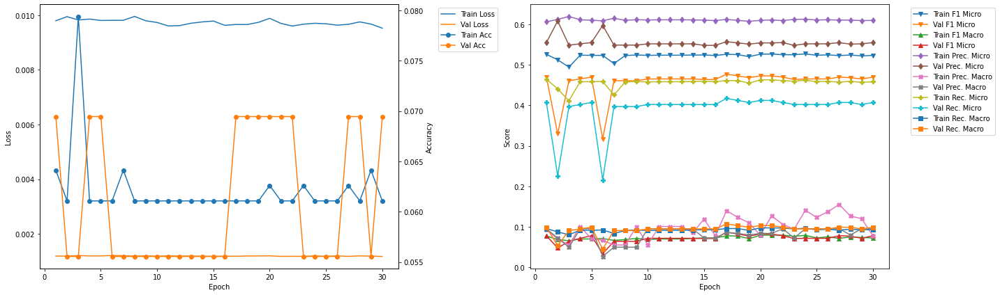

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.82
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0824 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4809 	Validation F1 Micro: 0.5118
Train F1 Marco: 0.0726 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6071 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0808 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.3981 	Validation Recall Micro: 0.4439
Train Recall Marco: 0.083 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 51.01
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0794 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4798 	Validation F1 Micro: 0.5118
Train F1 Marco: 0.0718 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6159 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0938 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.39

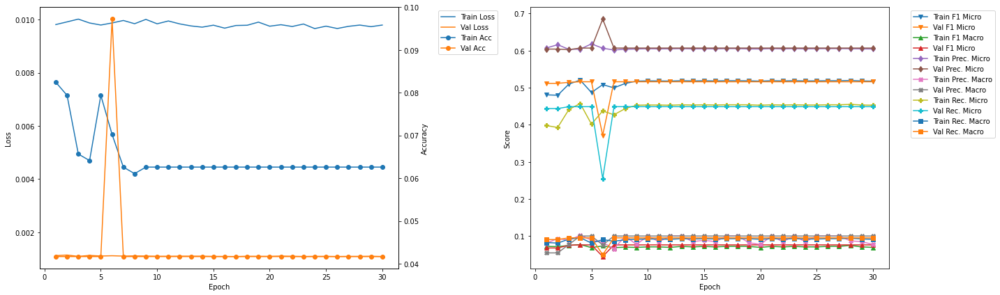

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 5 	Epoch: 2
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0627 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4992 	Validation F1 Micro: 0.5697
Train F1 Marco: 0.0695 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6085 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0681 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.4231 	Validation Recall Micro: 0.5109
Train Recall Marco: 0.087 	Validation Recall Macro: 0.0909


In [25]:
vgg11bnLSTM_500_1_0_best = Kfold_train_CNN_RNN(model = vgg11bnLSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.2
Train Loss: 0.0207 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0993 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0626 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1438 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1257 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0758 	Validation Recall Micro: 0.0
Train Recall Marco: 0.057 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.4
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

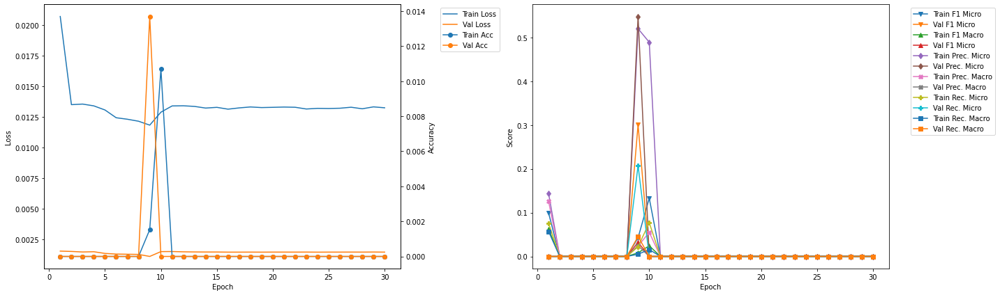

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.25
Train Loss: 0.0131 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.45
Train Loss: 0.0123 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

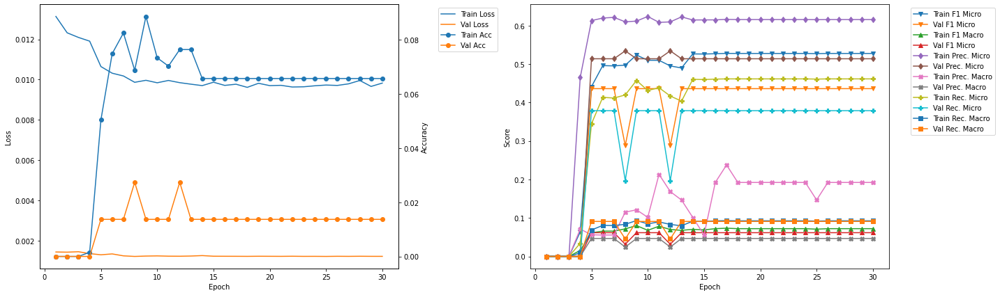

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.31
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.4641 	Validation F1 Micro: 0.3704
Train F1 Marco: 0.0628 	Validation F1 Macro: 0.0527
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.6579
Train Precision Marco: 0.0693 	Validation Precision Macro: 0.1208
Train Recall Mirco: 0.3759 	Validation Recall Micro: 0.2577
Train Recall Marco: 0.0741 	Validation Recall Macro: 0.0546

Validation F1 Micro Score Increased (0.436047 --> 0.502924).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.53
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4951 	Validation F1 Micro: 0.5029
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0828
Train Precision Mirco: 0.6068 	Validation Precision Micro: 0.5811
Train Precisio

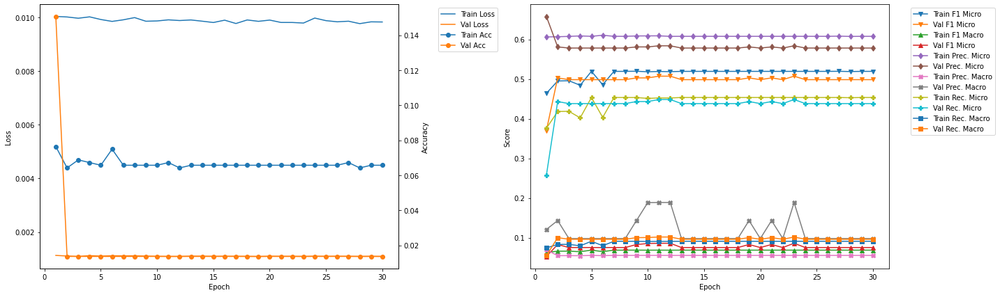

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.507289 --> 0.525714).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 18.39
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5017 	Validation F1 Micro: 0.5257
Train F1 Marco: 0.0767 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.5992 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.1213 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4314 	Validation Recall Micro: 0.451
Train Recall Marco: 0.0889 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.59
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4975 	Validation F1 Micro: 0.5242
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.5995 	Validation Precision Micro: 0.6259
Train Precision

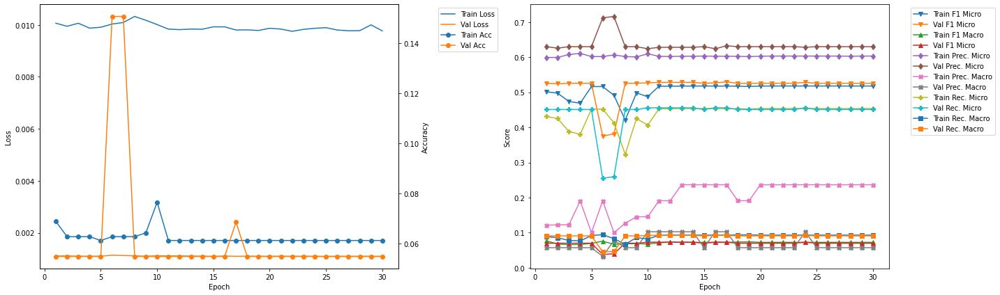

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.48
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5023 	Validation F1 Micro: 0.5101
Train F1 Marco: 0.0782 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.5986 	Validation Precision Micro: 0.6069
Train Precision Marco: 0.1723 	Validation Precision Macro: 0.0552
Train Recall Mirco: 0.4327 	Validation Recall Micro: 0.44
Train Recall Marco: 0.0902 	Validation Recall Macro: 0.09

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.68
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4943 	Validation F1 Micro: 0.5145
Train F1 Marco: 0.069 	Validation F1 Macro: 0.0686
Train Precision Mirco: 0.6188 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.1692 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4116 	Val

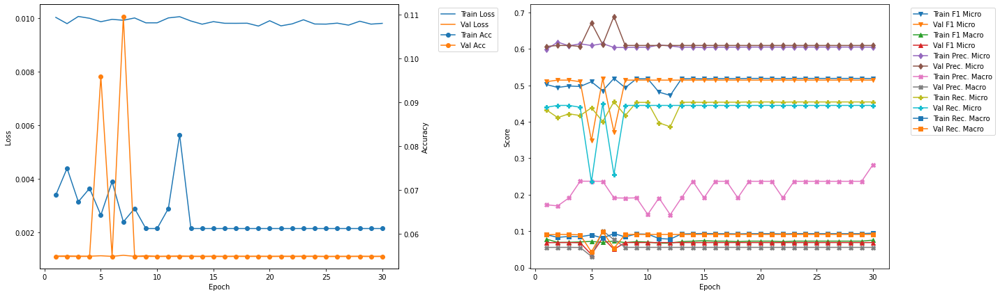

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.5
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.078 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4938 	Validation F1 Micro: 0.5043
Train F1 Marco: 0.0751 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6026 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.2279 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4182 	Validation Recall Micro: 0.4372
Train Recall Marco: 0.0867 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.7
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5191 	Validation F1 Micro: 0.5043
Train F1 Marco: 0.0723 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6056 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.1914 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4542 	V

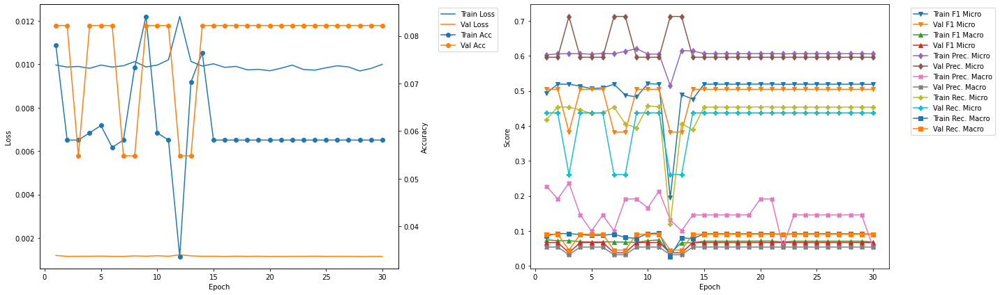

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.53
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.137
Train F1 Mirco: 0.4934 	Validation F1 Micro: 0.3956
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0387
Train Precision Mirco: 0.6047 	Validation Precision Micro: 0.7397
Train Precision Marco: 0.1453 	Validation Precision Macro: 0.0336
Train Recall Mirco: 0.4167 	Validation Recall Micro: 0.27
Train Recall Marco: 0.0847 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.529915 --> 0.543353).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.74
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4568 	Validation F1 Micro: 0.5434
Train F1 Marco: 0.0639 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.6147 	Validation Precision Micro: 0.6438
Train Precision

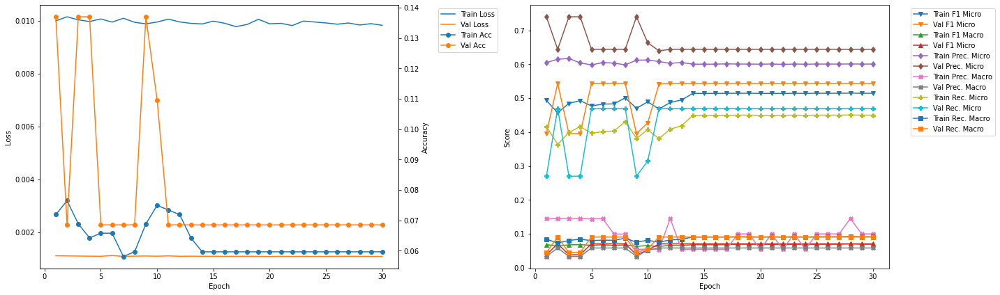

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.57
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4746 	Validation F1 Micro: 0.3383
Train F1 Marco: 0.0634 	Validation F1 Macro: 0.035
Train Precision Mirco: 0.5974 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0533 	Validation Precision Macro: 0.0284
Train Recall Mirco: 0.3936 	Validation Recall Micro: 0.232
Train Recall Marco: 0.0783 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.543353 --> 0.550296).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.8
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0947 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4481 	Validation F1 Micro: 0.5503
Train F1 Marco: 0.0598 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.62 	Validation Precision Micro: 0.6458
Train Precision Ma

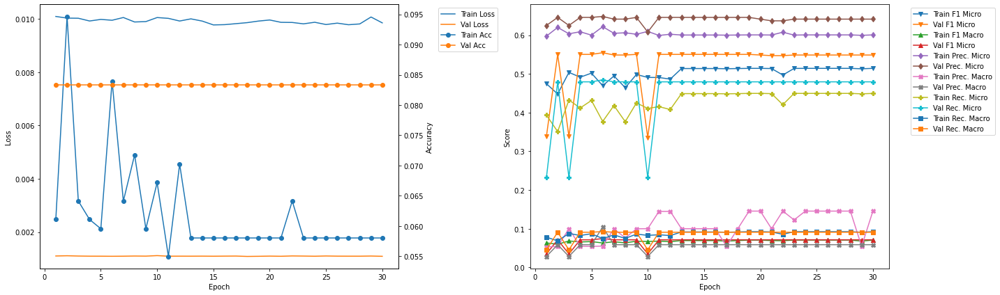

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 48.64
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.1528
Train F1 Mirco: 0.498 	Validation F1 Micro: 0.3952
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0368
Train Precision Mirco: 0.6067 	Validation Precision Micro: 0.6806
Train Precision Marco: 0.0776 	Validation Precision Macro: 0.0309
Train Recall Mirco: 0.4224 	Validation Recall Micro: 0.2784
Train Recall Marco: 0.0856 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 48.84
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0718 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4734 	Validation F1 Micro: 0.5312
Train F1 Marco: 0.0638 	Validation F1 Macro: 0.0671
Train Precision Mirco: 0.6144 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.3851 	Vali

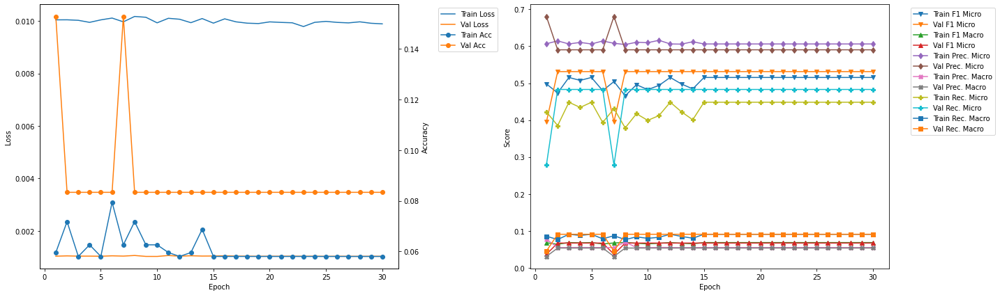

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.65
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4878 	Validation F1 Micro: 0.5225
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.6054 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4084 	Validation Recall Micro: 0.4603
Train Recall Marco: 0.0813 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.85
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0824 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4756 	Validation F1 Micro: 0.5225
Train F1 Marco: 0.0637 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.6144 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.3

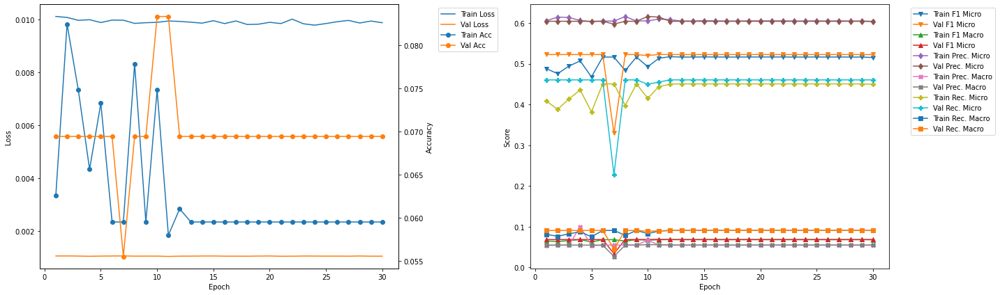

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 6
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.084 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4695 	Validation F1 Micro: 0.5546
Train F1 Marco: 0.0632 	Validation F1 Macro: 0.0746
Train Precision Mirco: 0.6218 	Validation Precision Micro: 0.6483
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.1042
Train Recall Mirco: 0.3771 	Validation Recall Micro: 0.4845
Train Recall Marco: 0.0745 	Validation Recall Macro: 0.0926


In [26]:
vgg16bnLSTM_500_1_0_best = Kfold_train_CNN_RNN(model = vgg16bnLSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.21
Train Loss: 0.0167 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0605 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0422 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1341 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1268 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0391 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0348 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.42
Train Loss: 0.0124 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

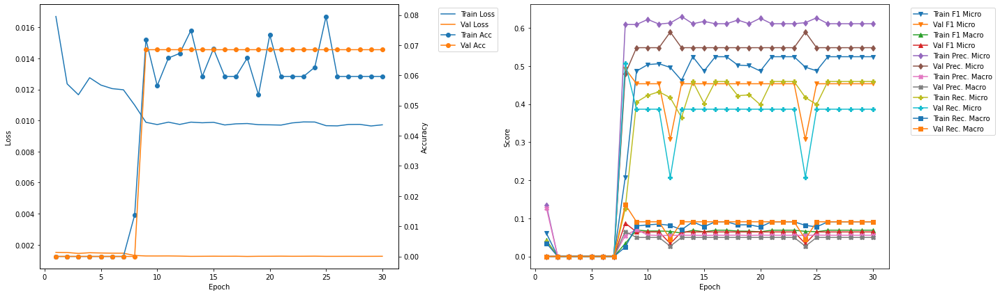

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.48
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4995 	Validation F1 Micro: 0.4847
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0637
Train Precision Mirco: 0.6151 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4205 	Validation Recall Micro: 0.4389
Train Recall Marco: 0.0837 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.69
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5128 	Validation F1 Micro: 0.4847
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0637
Train Precision Mirco: 0.6095 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4426 	Val

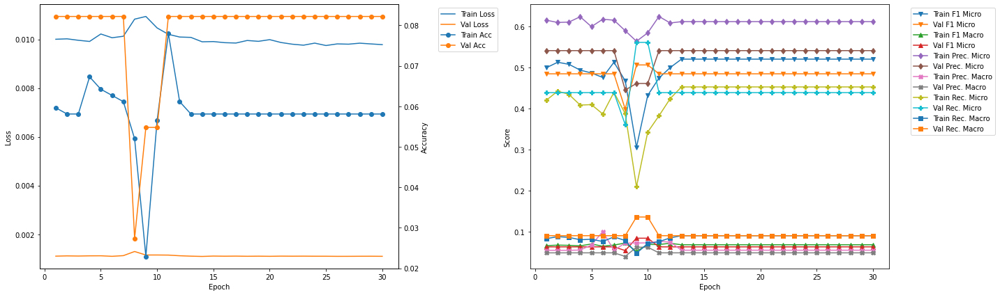

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.506266 --> 0.569733).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 12.8
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4593 	Validation F1 Micro: 0.5697
Train F1 Marco: 0.0619 	Validation F1 Macro: 0.0718
Train Precision Mirco: 0.602 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0534 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.3713 	Validation Recall Micro: 0.5026
Train Recall Marco: 0.074 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.01
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0673 	Validation Accuracy: 0.1781
Train F1 Mirco: 0.5074 	Validation F1 Micro: 0.4167
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0391
Train Precision Mirco: 0.602 	Validation Precision Micro: 0.7534
Train Precision 

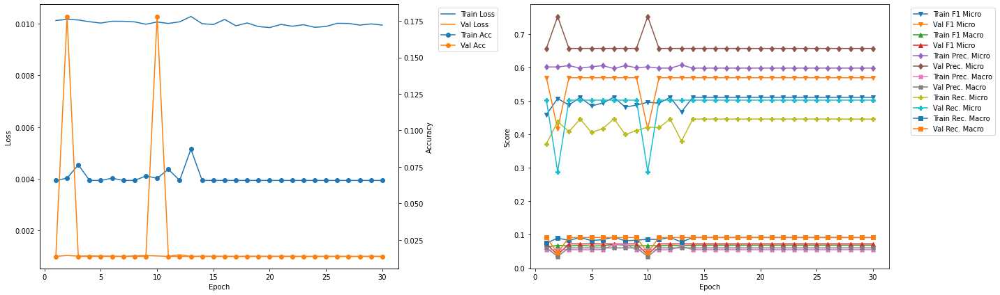

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.05
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4962 	Validation F1 Micro: 0.51
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6218 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0559 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4128 	Validation Recall Micro: 0.4384
Train Recall Marco: 0.0818 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.25
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4966 	Validation F1 Micro: 0.51
Train F1 Marco: 0.066 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6068 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4203 	V

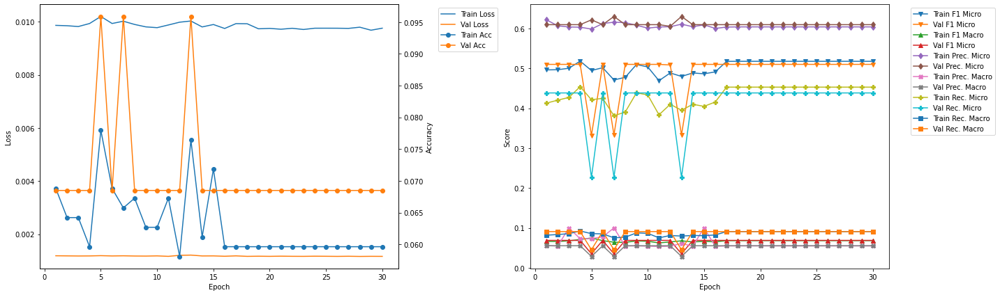

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.28
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0627 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4687 	Validation F1 Micro: 0.5556
Train F1 Marco: 0.0629 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.6047 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0538 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.3826 	Validation Recall Micro: 0.4847
Train Recall Marco: 0.0761 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.49
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.081 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4686 	Validation F1 Micro: 0.5556
Train F1 Marco: 0.0631 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.6131 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.3792 

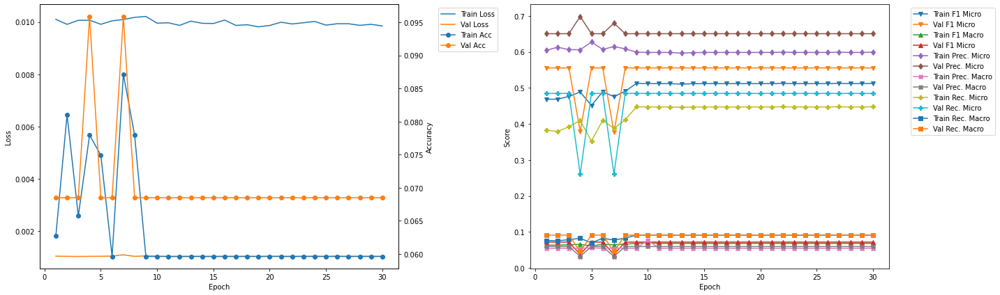

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.53
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4642 	Validation F1 Micro: 0.5223
Train F1 Marco: 0.0623 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6085 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3753 	Validation Recall Micro: 0.4607
Train Recall Marco: 0.074 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.73
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5148 	Validation F1 Micro: 0.5163
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.068
Train Precision Mirco: 0.6028 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.1004 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4493 	

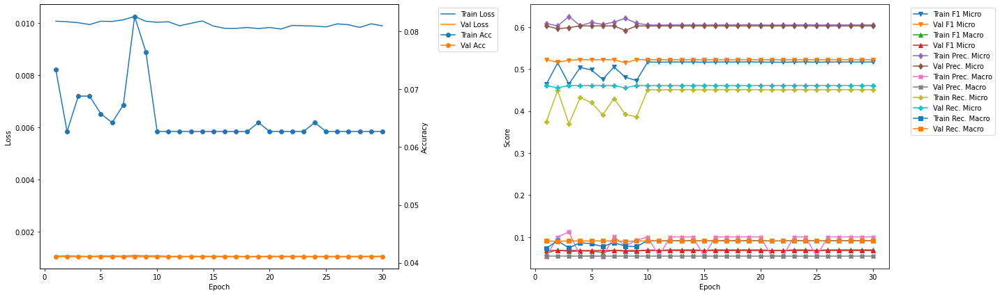

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.76
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.5117 	Validation F1 Micro: 0.3895
Train F1 Marco: 0.0691 	Validation F1 Macro: 0.0378
Train Precision Mirco: 0.6062 	Validation Precision Micro: 0.7123
Train Precision Marco: 0.1004 	Validation Precision Macro: 0.0324
Train Recall Mirco: 0.4427 	Validation Recall Micro: 0.268
Train Recall Marco: 0.0894 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.97
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4963 	Validation F1 Micro: 0.5118
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6079 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.1003 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4193 

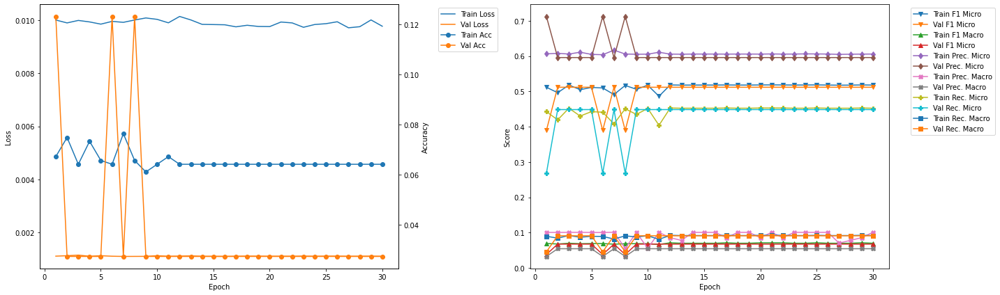

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.01
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4971 	Validation F1 Micro: 0.4866
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0658
Train Precision Mirco: 0.6158 	Validation Precision Micro: 0.5694
Train Precision Marco: 0.1008 	Validation Precision Macro: 0.0518
Train Recall Mirco: 0.4168 	Validation Recall Micro: 0.4249
Train Recall Marco: 0.0837 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.21
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5207 	Validation F1 Micro: 0.4866
Train F1 Marco: 0.07 	Validation F1 Macro: 0.0658
Train Precision Mirco: 0.6087 	Validation Precision Micro: 0.5694
Train Precision Marco: 0.1008 	Validation Precision Macro: 0.0518
Train Recall Mirco: 0.455 	Va

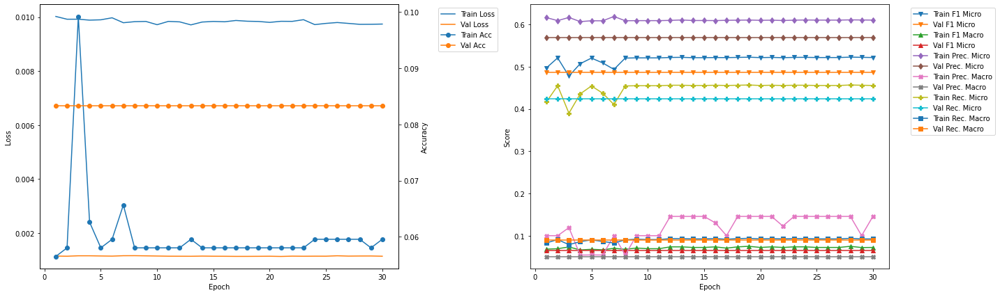

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.24
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5147 	Validation F1 Micro: 0.5552
Train F1 Marco: 0.0739 	Validation F1 Macro: 0.0819
Train Precision Mirco: 0.6017 	Validation Precision Micro: 0.6414
Train Precision Marco: 0.1305 	Validation Precision Macro: 0.1035
Train Recall Mirco: 0.4496 	Validation Recall Micro: 0.4895
Train Recall Marco: 0.0939 	Validation Recall Macro: 0.0974

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.45
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0656 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4671 	Validation F1 Micro: 0.4106
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0499
Train Precision Mirco: 0.6128 	Validation Precision Micro: 0.7397
Train Precision Marco: 0.1454 	Validation Precision Macro: 0.0789
Train Recall Mirco: 0.3773 	V

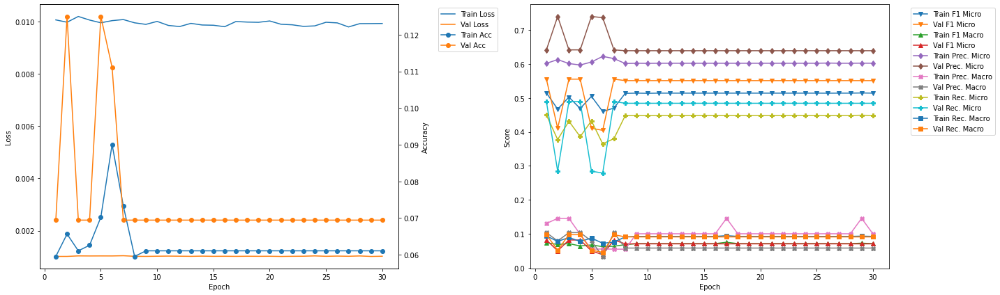

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 56.48
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5018 	Validation F1 Micro: 0.5303
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0817
Train Precision Mirco: 0.6052 	Validation Precision Micro: 0.6345
Train Precision Marco: 0.1001 	Validation Precision Macro: 0.1029
Train Recall Mirco: 0.4287 	Validation Recall Micro: 0.4554
Train Recall Marco: 0.0863 	Validation Recall Macro: 0.0974

Epoch 2 	Learning Rate: 0.01 	Time (min): 56.68
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4545 	Validation F1 Micro: 0.5303
Train F1 Marco: 0.0607 	Validation F1 Macro: 0.0817
Train Precision Mirco: 0.6134 	Validation Precision Micro: 0.6345
Train Precision Marco: 0.0539 	Validation Precision Macro: 0.1029
Train Recall Mirco: 0.361

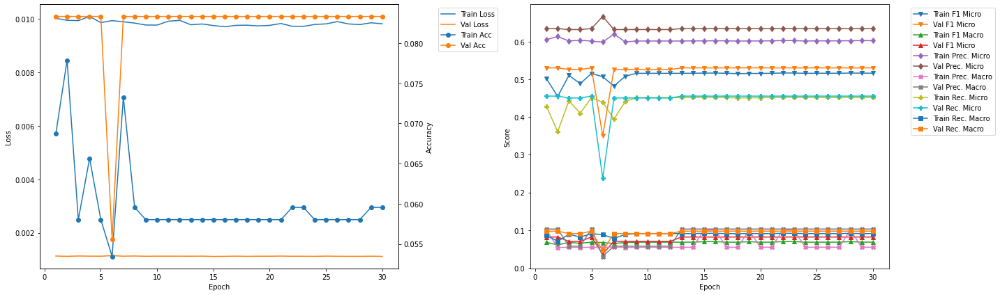

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 1
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4593 	Validation F1 Micro: 0.5697
Train F1 Marco: 0.0619 	Validation F1 Macro: 0.0718
Train Precision Mirco: 0.602 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0534 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.3713 	Validation Recall Micro: 0.5026
Train Recall Marco: 0.074 	Validation Recall Macro: 0.0909


In [27]:
vgg19bnLSTM_500_1_0_best = Kfold_train_CNN_RNN(model = vgg19bnLSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_500_1_0')

In [28]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 7:32:44


## Training Summary

### Summary Table

In [29]:
summaryDF = pd.DataFrame({
    'ResNet18' : resnet18LSTM_500_1_0_best,
    'ResNet50' : resnet50LSTM_500_1_0_best,
    'ResNet101' : resnet101LSTM_500_1_0_best,
    'DenseNet121' : densenet121LSTM_500_1_0_best,
    'DenseNet169' : densenet169LSTM_500_1_0_best,
    'DenseNet201' : densenet201LSTM_500_1_0_best,
    'VGG11_BN' : vgg11bnLSTM_500_1_0_best,
    'VGG16_BN' : vgg16bnLSTM_500_1_0_best,
    'VGG19_BN' : vgg19bnLSTM_500_1_0_best
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,8.000000,1.000000,7.000000,7.000000,9.000000,7.000000,5.000000,8.000000,3.000000
Epoch,1.000000,4.000000,1.000000,14.000000,5.000000,3.000000,2.000000,6.000000,1.000000
Train Loss,0.009929,0.011775,0.009968,0.010228,0.009761,0.009679,0.010070,0.009951,0.010130
Train Accuracy,0.073282,0.016820,0.081040,0.062691,0.068702,0.090214,0.062691,0.083969,0.065749
Train F1 Micro,0.470711,0.127919,0.462373,0.481650,0.457857,0.472843,0.499164,0.469460,0.459317
Train F1 Macro,0.063334,0.022973,0.061429,0.096958,0.106736,0.106429,0.069520,0.063175,0.061870
Train Precision Micro,0.598238,0.605769,0.603970,0.608657,0.614573,0.611009,0.608483,0.621825,0.602031
Train Precision Macro,0.053420,0.055070,0.053401,0.184708,0.222522,0.294146,0.068091,0.055156,0.053408
Train Recall Micro,0.388000,0.071510,0.374560,0.398496,0.364826,0.385640,0.423142,0.377068,0.371298
Train Recall Macro,0.077885,0.014550,0.072991,0.094241,0.096454,0.098670,0.086977,0.074488,0.074041


In [31]:
summaryDF.to_csv('BestCnnRnnModels/BestModels_500_1_0.csv', index = True)

### Training Summary Graph

In [32]:
import plotly
import plotly.graph_objects as go

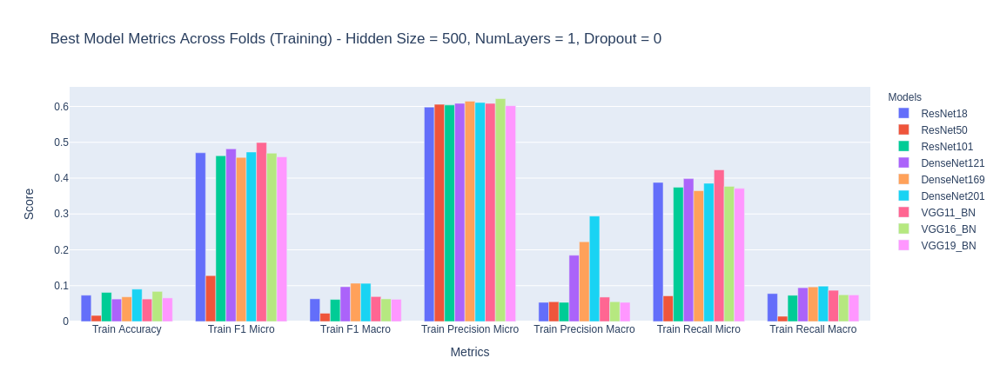

In [33]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training) - Hidden Size = 500, NumLayers = 1, Dropout = 0',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

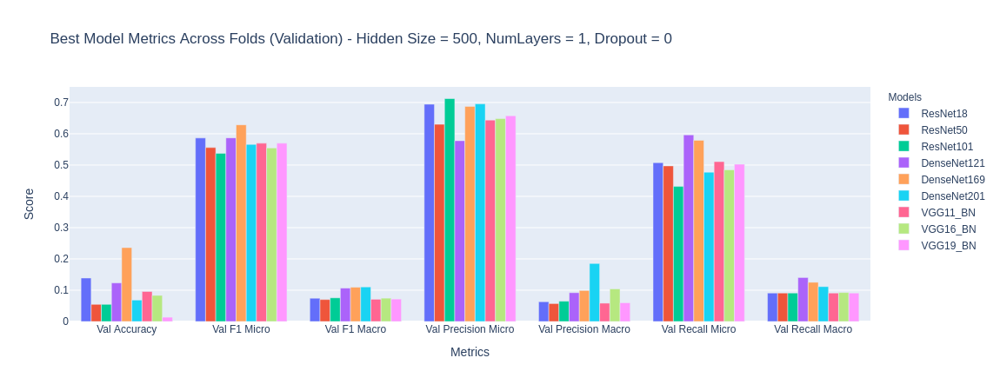

In [34]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation) - Hidden Size = 500, NumLayers = 1, Dropout = 0',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()